In [104]:
%%capture
!pip install numpy
!pip install pandas
!pip install scikit-learn
!pip install seaborn
!pip install openTSNE umap-learn pacmap
!pip install ipywidgets

##  Задание 4. PCA, tSNE, UMAP, PacMAP

### task1

**Формулировка:** Сгенерировать и визуализировать на парах признаков 5-мерный датасет df из 1000
точек, в котором отдельные точки данных расположены вдоль линии с началом
(0,0,0,0,0) и завершением (+A,+A,+A,+A,+A) с дисперсиями вдоль осей: 
- для оси 1 = A/k,
- для оси 2 = A/k, 
- для оси 3 = A/(k*2), 
- для оси 4 = A/(k*4), 
- для оси 5 = A/(k*8), 
где k может быть в диапазоне от 4 до 40.

In [135]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [136]:
N = 1000 # number of points in data
A = 100
k = 10

In [137]:
line_base = np.linspace(0, A, N)

In [138]:
variances = [A/k, A/k, A/(k * 2), A/(k * 4), A/(k * 8)]
scales = np.sqrt(variances)

In [139]:
data = {}
for i, scale in enumerate(scales):
    axis_name = f"axis_{i+1}"
    data[axis_name] = line_base + np.random.normal(loc=0.0, scale=scale, size=N)

In [140]:
df=pd.DataFrame(data)
df.head()

,axis_1,axis_2,axis_3,axis_4,axis_5
0,0.574429,-3.064738,-1.387970,-0.243110,0.865809
1,-0.403348,0.234520,-0.199084,0.058449,-0.461407
2,-6.373301,-1.719516,-4.293058,1.017110,0.670190
3,0.396982,-0.758087,-2.369242,-0.707159,-1.142295
4,-0.548269,2.953658,2.511199,3.618189,0.282892


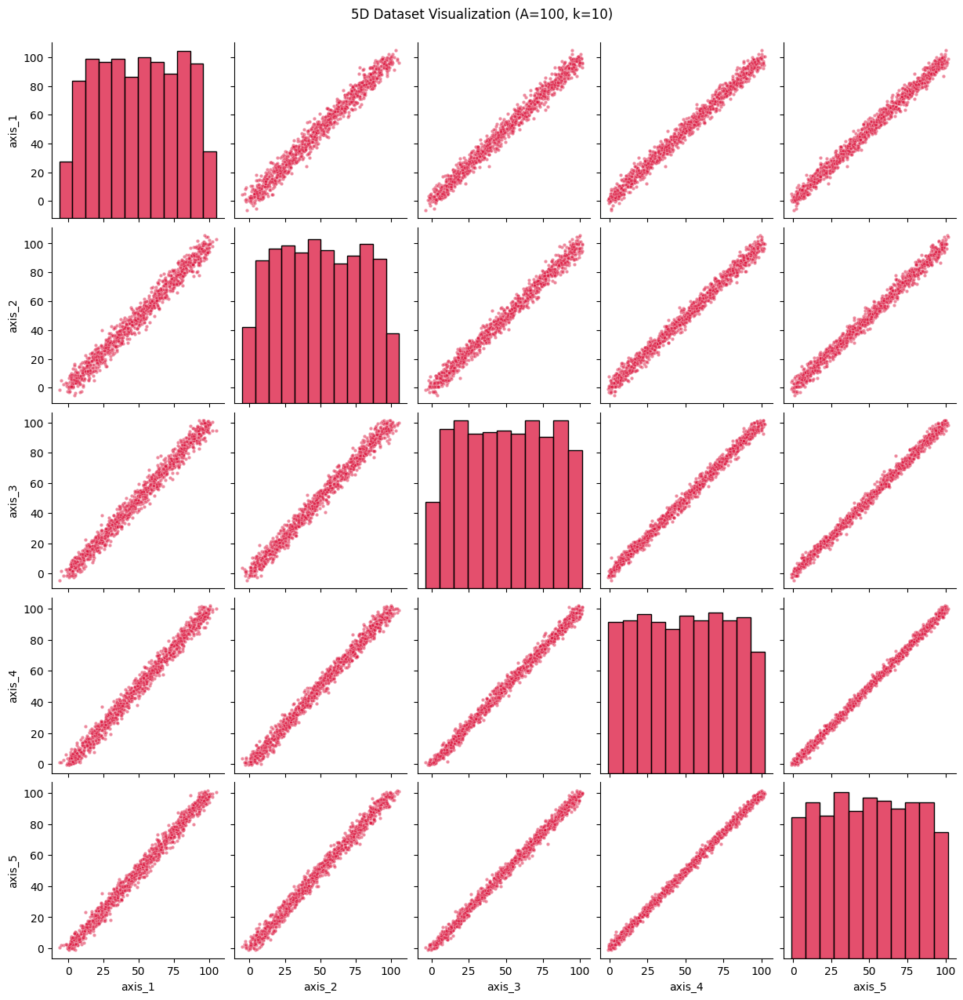

In [141]:
sns.pairplot(
    df,
    plot_kws={'alpha': 0.5, 's': 10, 'color' : 'crimson'},
    diag_kws={'color': 'crimson'}
)

plt.suptitle(f'5D Dataset Visualization (A={A}, k={k})', y=1.02)
plt.show()

### task2

**Формулировка:** На основе датасета df cгенерировать и визуализировать на парах признаков 5-мерные датасеты df_out_i, в которых помимо точек датасета df есть дополнительные 1000 точек с координатой

$(+A \cdot i, \;-A \cdot i, \;+A \cdot i, \;-A \cdot i, \;+A \cdot i)$$\text{, где } i \in \{1, 2, 5, 10\}$

In [142]:
def task2(i_value: int):
    
    df_orig = df.copy()
    df_orig['Type'] = 'Original Data'

    point = [A*i_value, -A*i_value, A*i_value, -A*i_value, A*i_value]
    points = [point] * 1000
    
    feature_cols = df.columns
    new_df = pd.DataFrame(points, columns=feature_cols)
    new_df['Type'] = f'New_Points_{i_value}'

    return pd.concat([df_orig, new_df], ignore_index=True)

In [143]:
i_values = [1, 2, 5, 10]
dfs_out = {f"df_out_{i}": task2(i) for i in i_values}

In [144]:
assert(dfs_out["df_out_1"].iloc[-1].to_list()[0:-1] == list(map(float, [A, -A, A, -A, A])))
assert(dfs_out["df_out_2"].iloc[-1].to_list()[0:-1] == list(map(float, [2*A, -2*A, 2*A, -2*A, 2*A])))

assert(dfs_out["df_out_1"].shape == (df.shape[0] + 1000, df.shape[1] + 1))

Visualizing df_out_1...


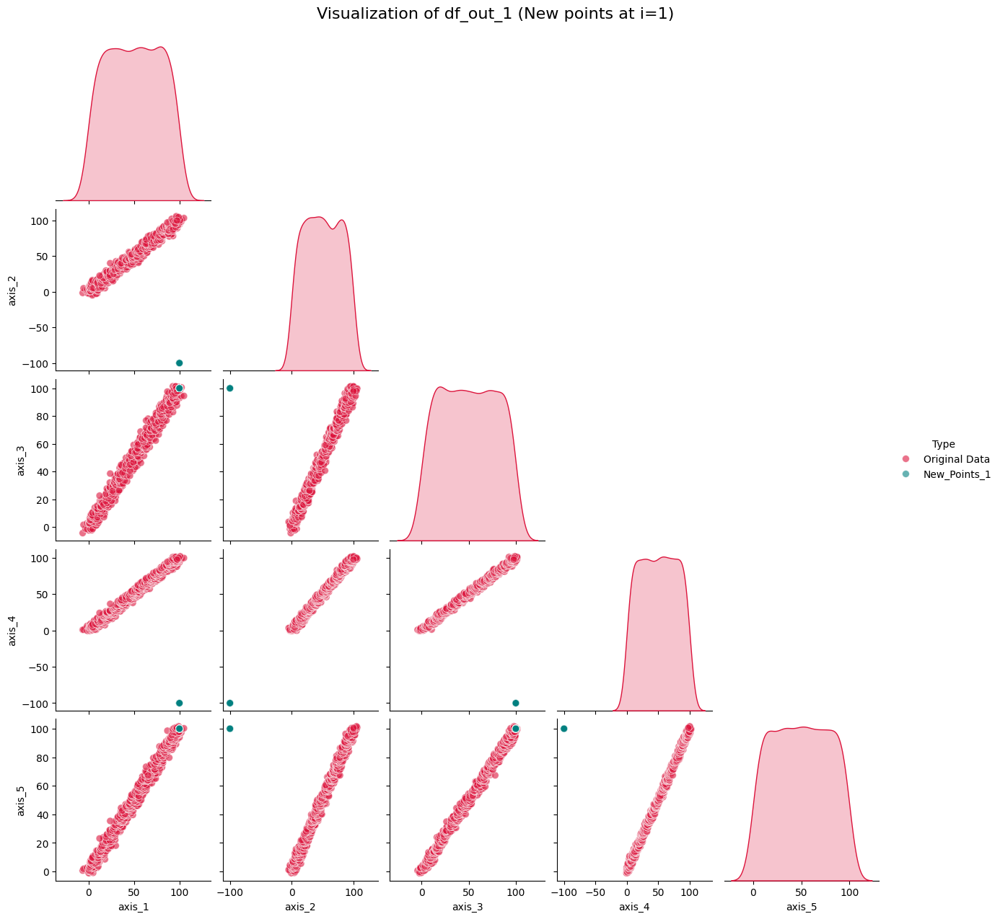

--------------------------------------------------
Visualizing df_out_2...


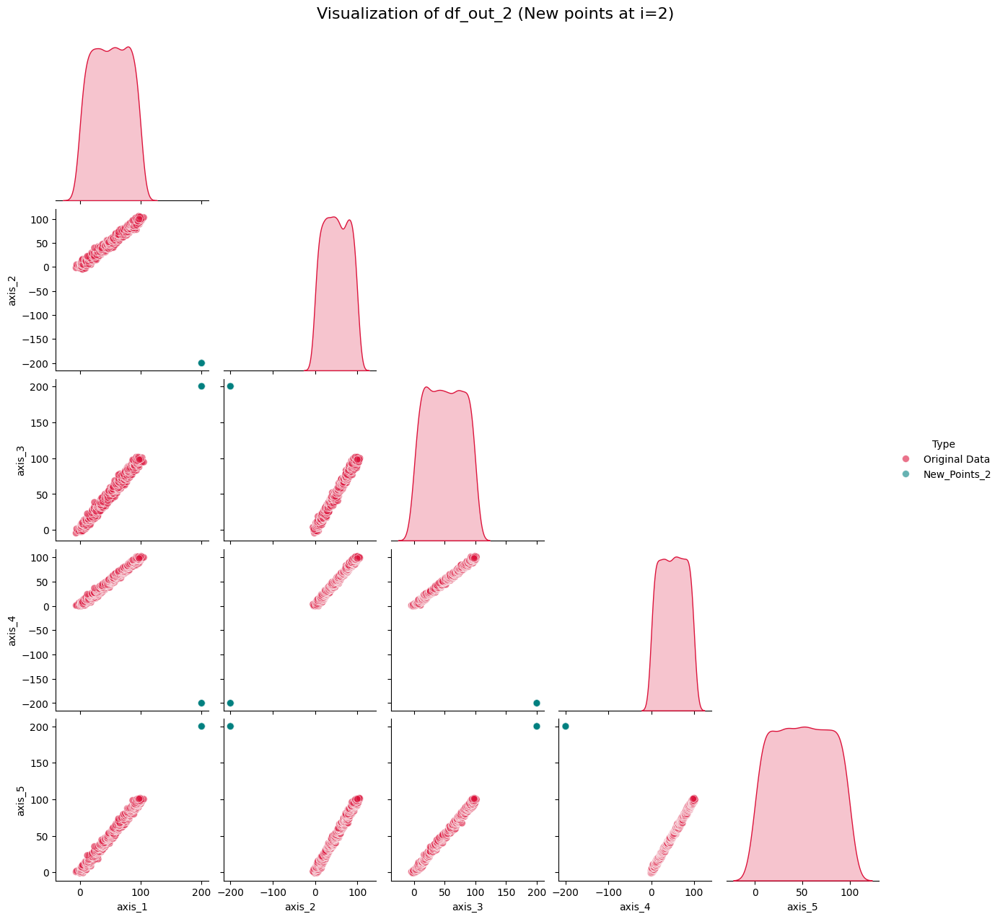

--------------------------------------------------
Visualizing df_out_5...


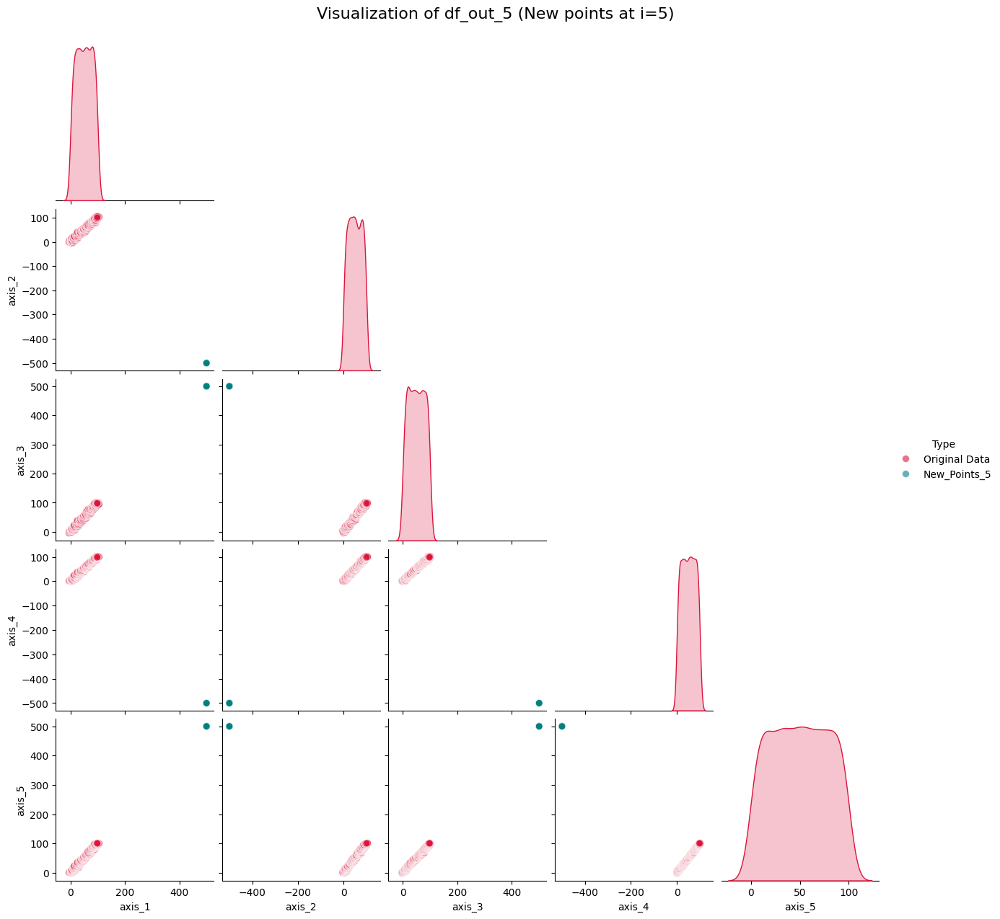

--------------------------------------------------
Visualizing df_out_10...


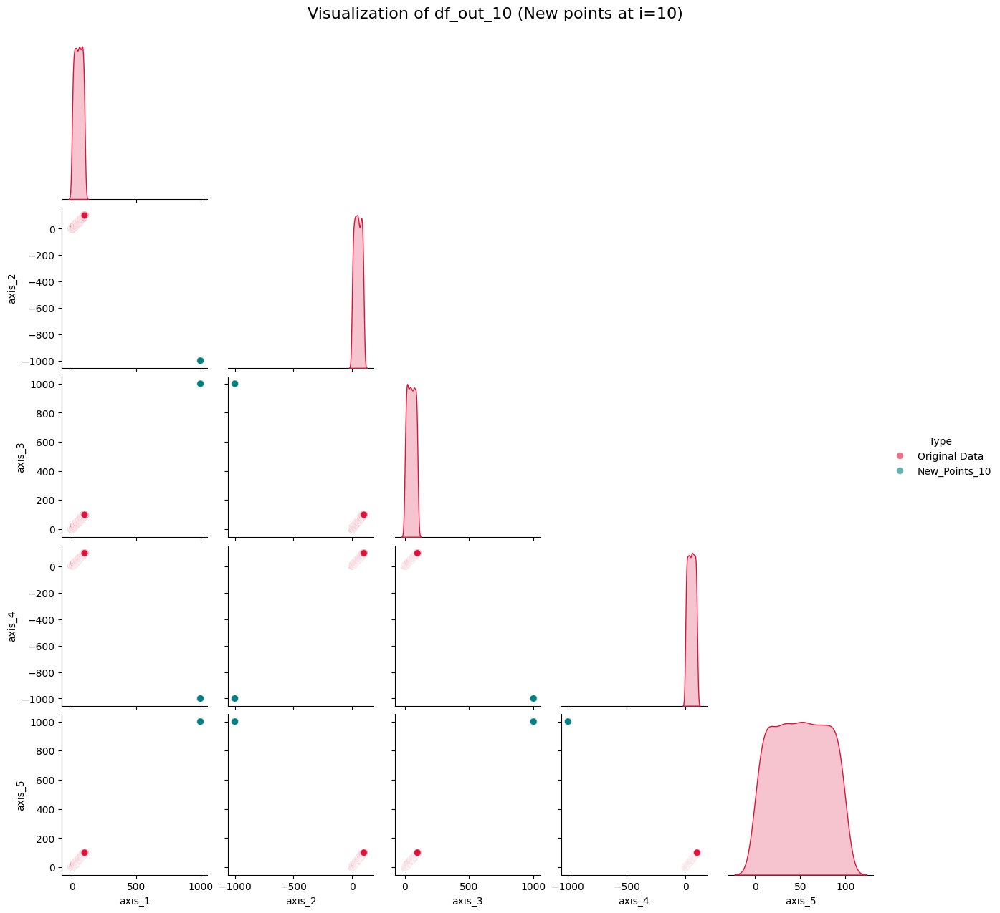

--------------------------------------------------


In [145]:
for name, current_df in dfs_out.items():
    print(f"Visualizing {name}...")

    new_points_label = current_df['Type'].iloc[-1]

    g = sns.pairplot(
        current_df,
        hue='Type',
        palette={
            'Original Data': 'crimson', 
            new_points_label: 'teal' 
        }, 
        plot_kws={'s': 50, 'alpha': 0.6},
        diag_kws={'fill': True},
        corner=True
    )

    i_val = name.split('_')[-1]
    g.fig.suptitle(f'Visualization of {name} (New points at i={i_val})', y=1.02, fontsize=16)

    plt.show()
    print("-" * 50)

### task3

**Формулировка:** Используя метод главных компонент (основанный на корреляциях), для каждого датасета (df и df_out_i) отдельно визуализировать:
- Scree plot;
- Отображения отдельных объектов-строк в двумерных пространствах всех пар главных компонент, без отображения старых векторов-переменных;
- Отображения отдельных объектов-строк в двумерных пространствах всех пар главных компонент, с отображением старых векторов-переменных;
- Отображения степени корреляции старых векторов-переменных с новыми векторами-переменными в двумерных пространствах всех пар главных компонет.

In [146]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [159]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

def task3(df_input, title_suffix="", target_col='Type', custom_palette=None):

    print(f"\n{'='*20} Processing: {title_suffix} {'='*20}")

    if target_col in df_input.columns:
        X = df_input.drop(columns=[target_col])
        hue_vals = df_input[target_col]
    else:
        X = df_input.select_dtypes(include=[np.number])
        hue_vals = None

    # --- 2. PCA ---
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    pca = PCA()
    X_pca = pca.fit_transform(X_scaled)
    
    component_names = [f"PC{i+1}" for i in range(X_pca.shape[1])]
    pca_df = pd.DataFrame(X_pca, columns=component_names)
    
    if hue_vals is not None:
        pca_df[target_col] = hue_vals.values

    final_palette = None
    
    if custom_palette is not None:
        # Если передали палитру явно - используем её
        final_palette = custom_palette
    elif hue_vals is not None:
        unique_vals = hue_vals.unique()
        if 'Original Data' in unique_vals:
            new_label = hue_vals.iloc[-1]
            final_palette = {'Original Data': 'steelblue', new_label: 'crimson'}
        else:
            final_palette = 'bright' 

    # Расчет нагрузок (Loadings)
    loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    plt.subplots_adjust(hspace=0.3, wspace=0.3)
    fig.suptitle(f'PCA Dashboard: {title_suffix}', fontsize=16, y=0.95)

    # --- [0, 0] Scree Plot ---
    ax = axes[0, 0]
    x_nums = range(1, len(pca.explained_variance_ratio_) + 1)
    ax.bar(x_nums, pca.explained_variance_ratio_, alpha=0.6, label='Individual')
    ax.plot(x_nums, np.cumsum(pca.explained_variance_ratio_), marker='o', color='r', label='Cumulative')
    ax.set_title('Scree Plot (Variance Explained)')
    ax.set_xlabel('Principal Component')
    ax.set_ylabel('Variance Ratio')
    ax.legend()
    ax.grid(True, alpha=0.3)

    # --- [0, 1] Heatmap (Correlations) ---
    ax = axes[0, 1]
    loadings_df = pd.DataFrame(loadings, columns=component_names, index=X.columns)
    sns.heatmap(loadings_df, annot=True, cmap='coolwarm', center=0, fmt=".2f", vmin=-1, vmax=1, ax=ax)
    ax.set_title('Correlation Matrix (Original vs PCs)')

    # --- [1, 0] Biplot (PC1 vs PC2) ---
    ax = axes[1, 0]
    sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue=target_col, palette=final_palette, alpha=0.6, ax=ax, legend=False)
    
    # Векторы
    max_val_pca = np.max(np.abs(X_pca[:, :2]))
    scale_factor = max_val_pca * 0.8
    
    for i, feature in enumerate(X.columns):
        pc1_load = loadings[i, 0]
        pc2_load = loadings[i, 1]
        ax.arrow(0, 0, pc1_load * scale_factor, pc2_load * scale_factor, 
                 color='black', alpha=0.8, head_width=scale_factor*0.03)
        ax.text(pc1_load * scale_factor * 1.15, pc2_load * scale_factor * 1.15, 
                feature, color='black', ha='center', va='center', fontweight='bold')
    
    ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%})")
    ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%})")
    ax.set_title('Biplot (PC1 vs PC2)')
    ax.grid(True, alpha=0.3)

    # --- [1, 1] Scores Plot (PC1 vs PC2) ---
    ax = axes[1, 1]
    sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue=target_col, palette=final_palette, alpha=0.6, s=50, ax=ax)
    ax.set_title('Scores Plot (PC1 vs PC2)')
    ax.grid(True, alpha=0.3)

    plt.show()

    # ==========================================
    # PAIRPLOT (Все компоненты)
    # ==========================================
    print(f"--- Pairplot (All Pairs) for {title_suffix} ---")
    g = sns.pairplot(
        pca_df, 
        hue=target_col if hue_vals is not None else None,
        palette=final_palette,
        diag_kind='hist',
        corner=True,
        height=1.5, 
        plot_kws={'alpha': 0.5, 's': 15},
        diag_kws={'fill': True}
    )
    g.fig.suptitle(f'PCA All Pairs: {title_suffix}', y=1.02)
    plt.show()


==================== Processing: Original DF ====================


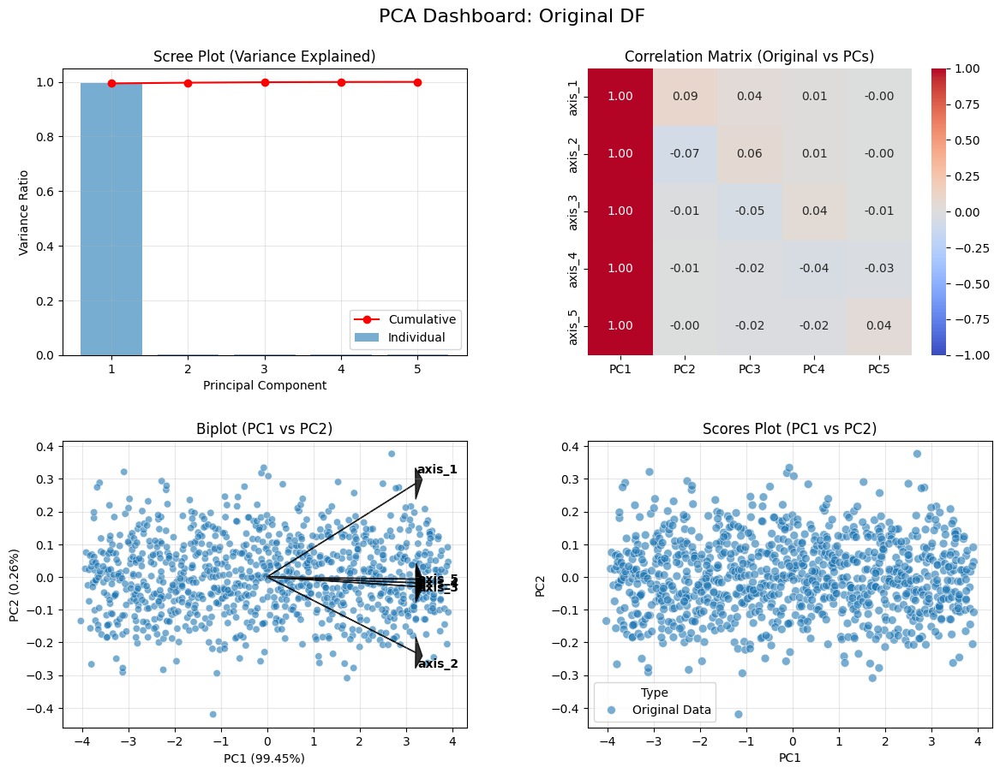

--- Pairplot (All Pairs) for Original DF ---


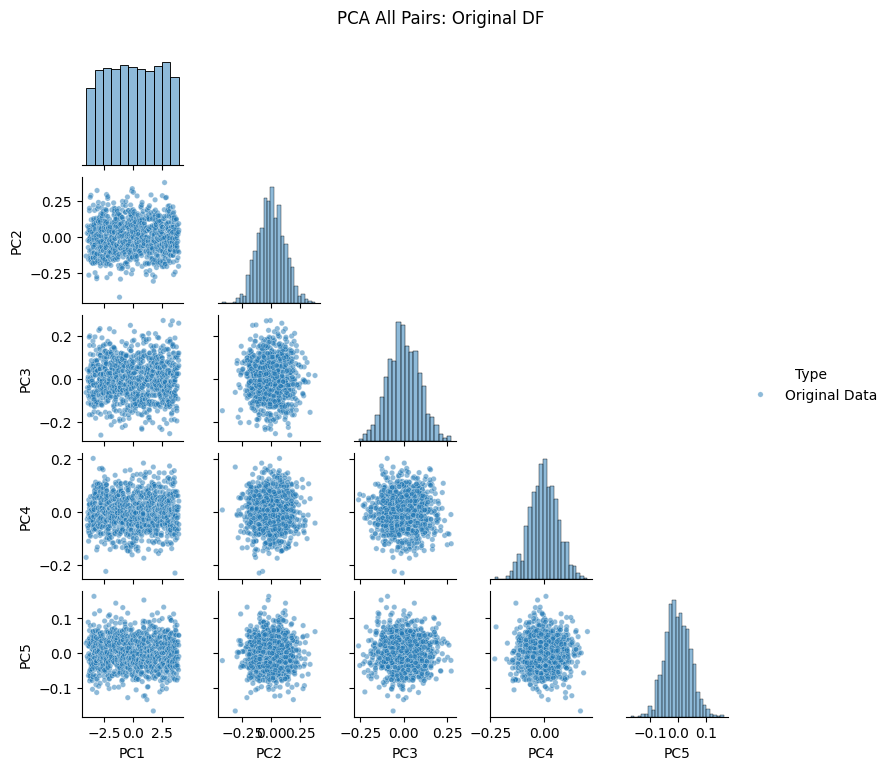


==================== Processing: df_out_1 ====================


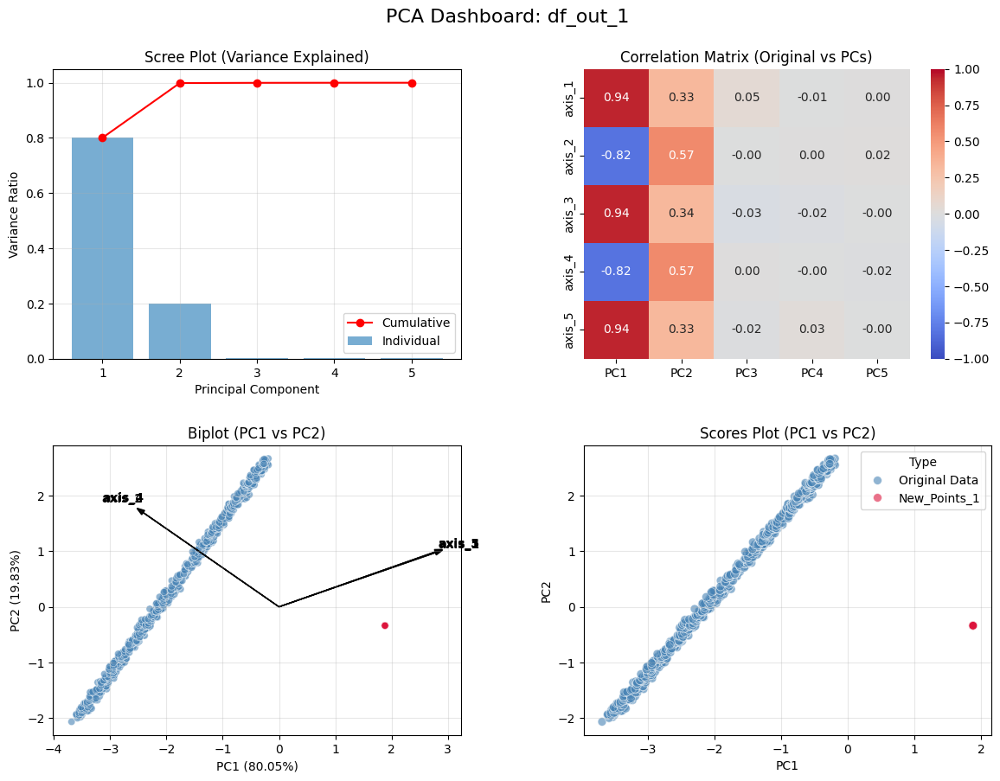

--- Pairplot (All Pairs) for df_out_1 ---


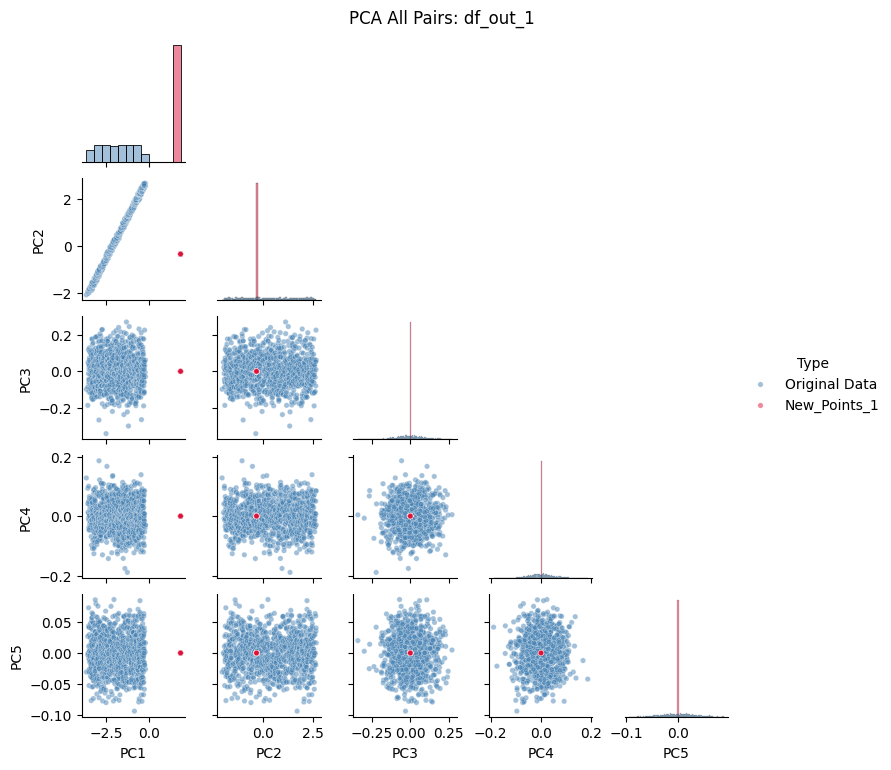


==================== Processing: df_out_2 ====================


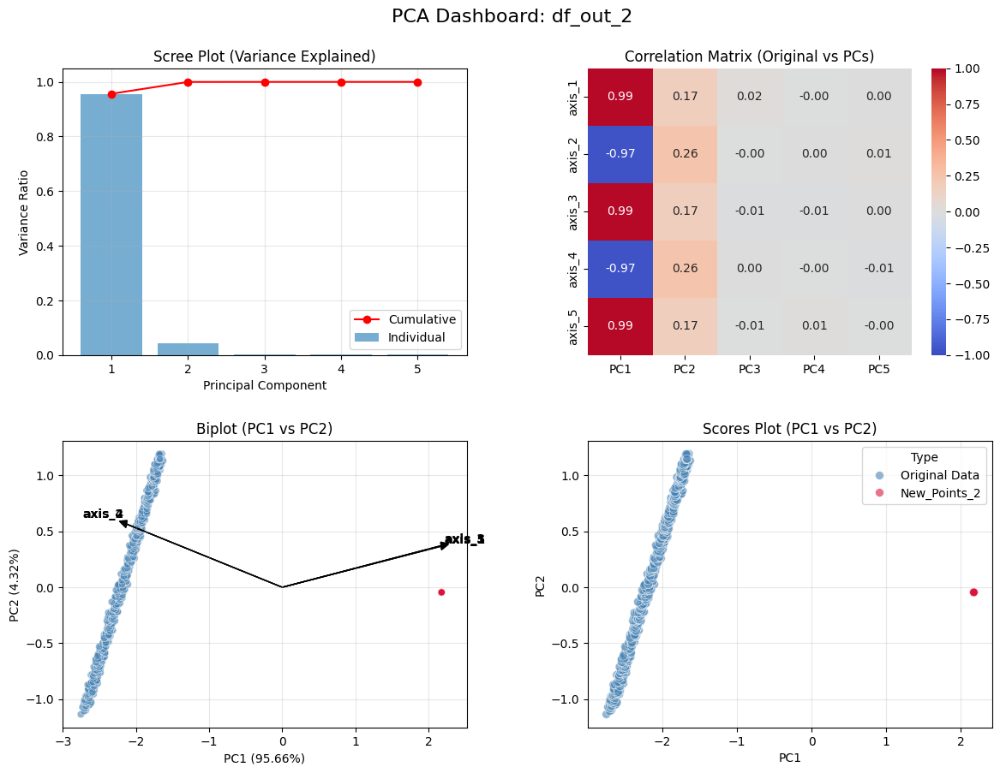

--- Pairplot (All Pairs) for df_out_2 ---


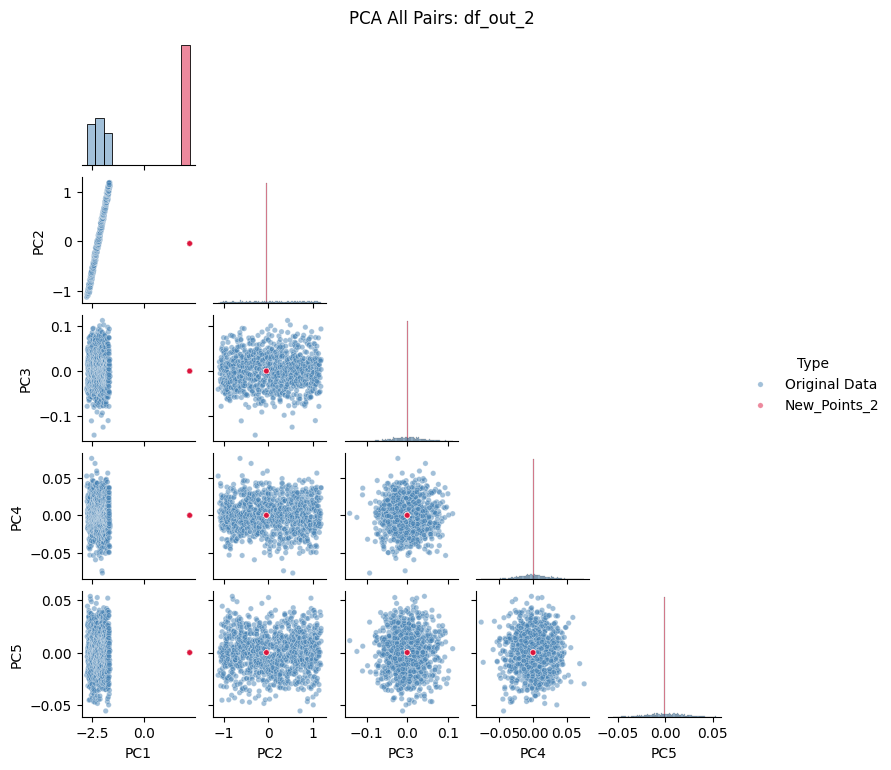


==================== Processing: df_out_5 ====================


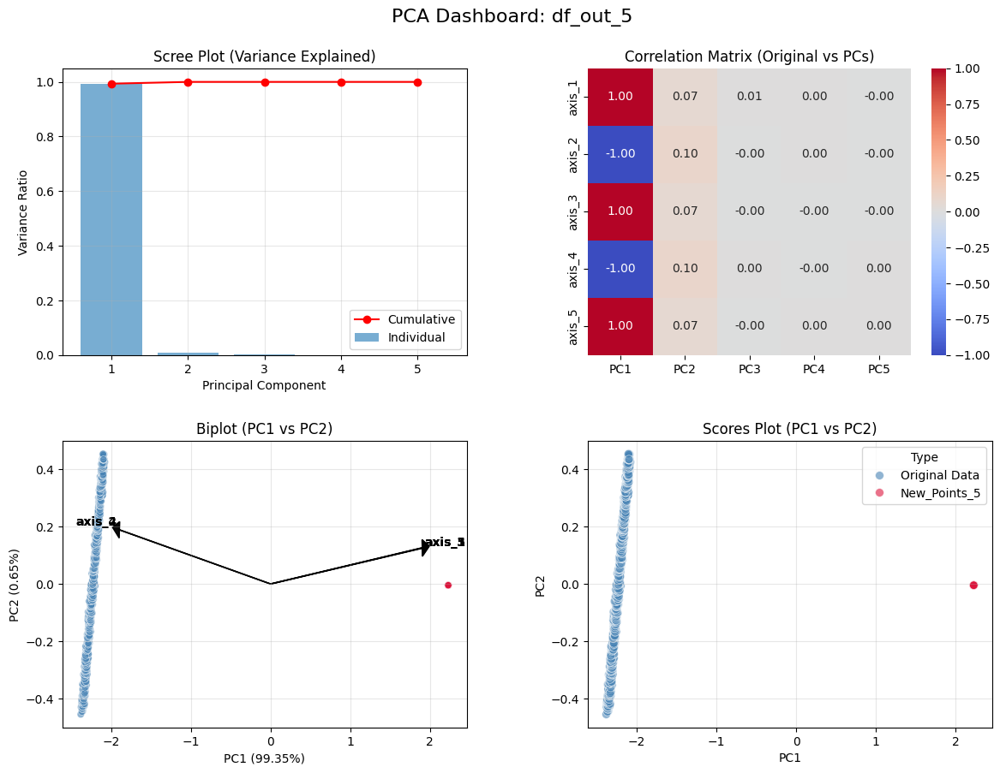

--- Pairplot (All Pairs) for df_out_5 ---


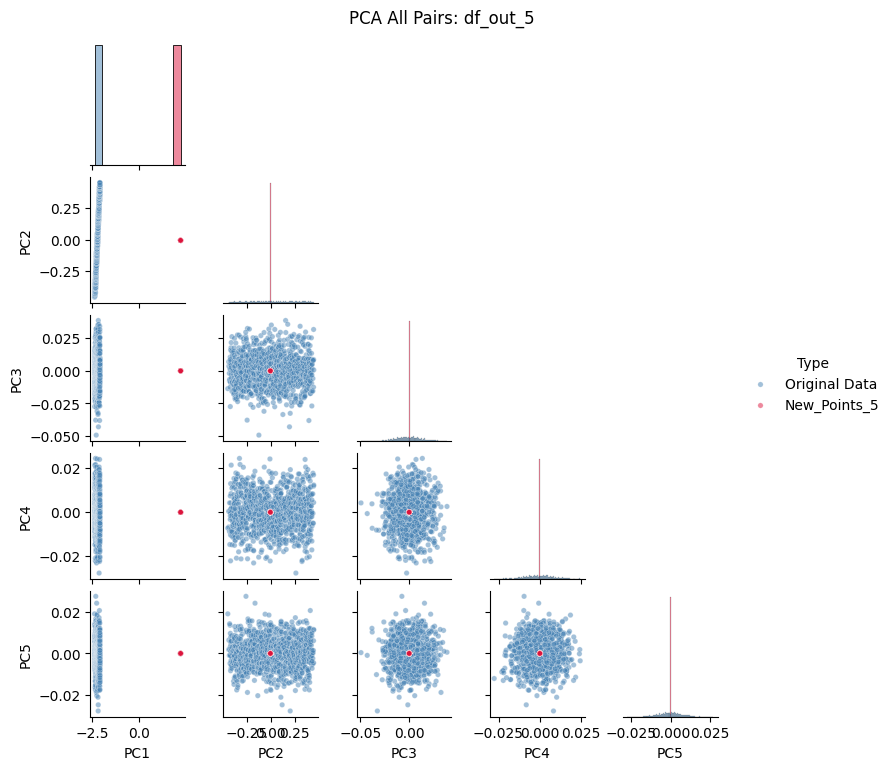


==================== Processing: df_out_10 ====================


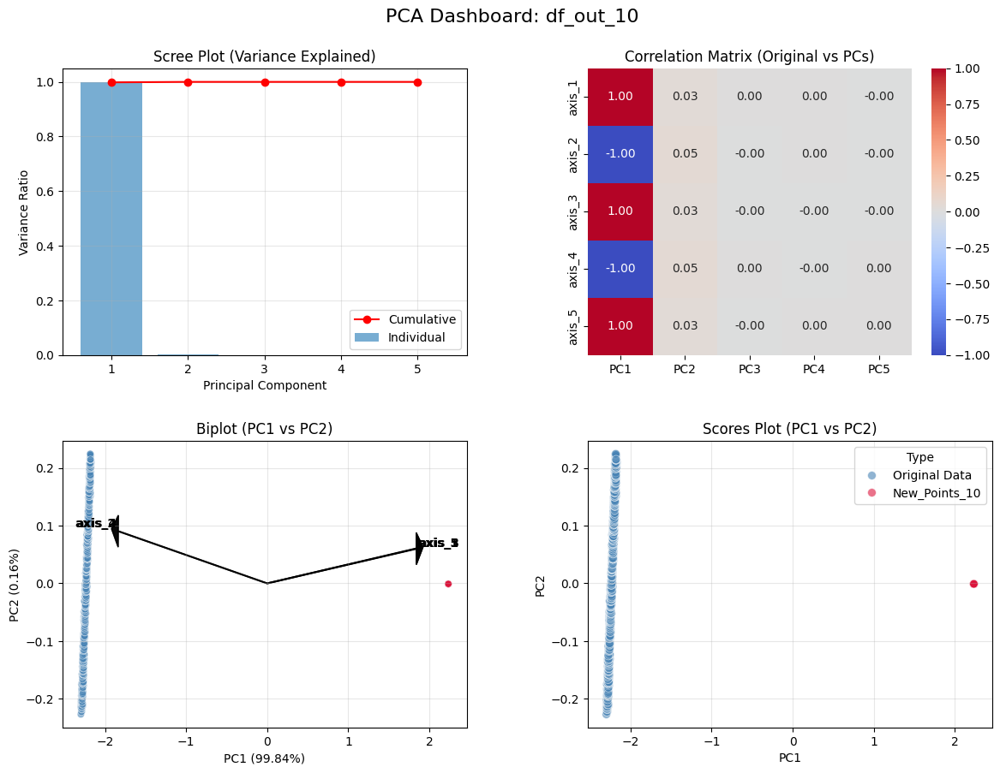

--- Pairplot (All Pairs) for df_out_10 ---


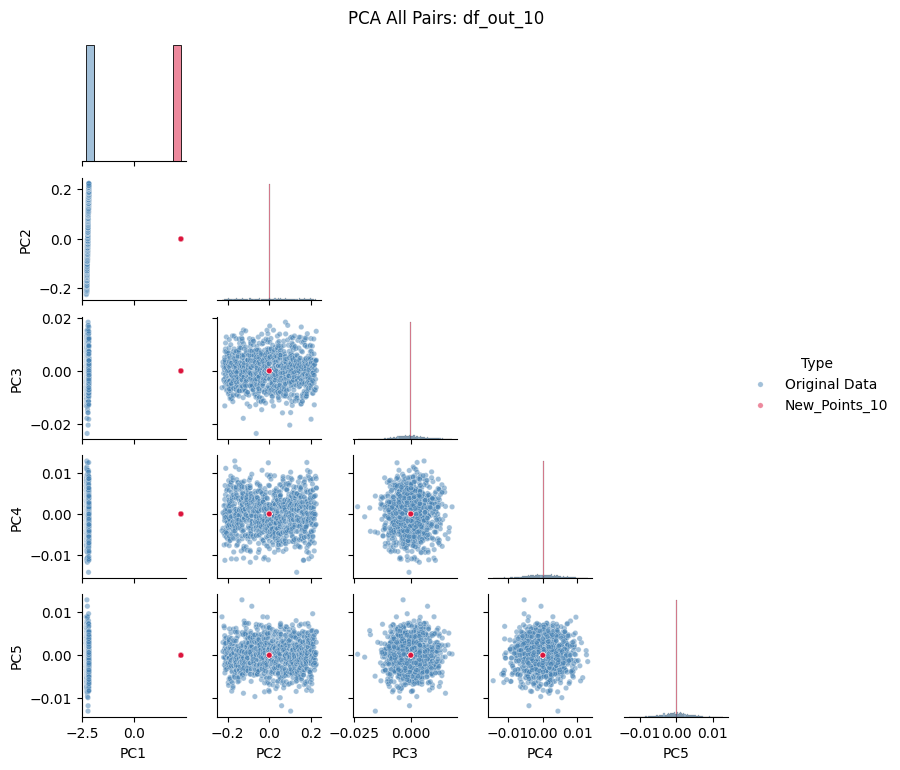

In [148]:
task3(df.assign(Type='Original Data'), title_suffix="Original DF")

for name, current_df in dfs_out.items():
    task3(current_df, title_suffix=name)

### task4

**Формулировка:** Используя методы: 
- UMAP, 
- PacMAP,
- tSNE, 

для каждого датасета (df и df_out_i) отдельно визуализировать проекции c нескольких (не менее 4) рендом-стартов, а также после предвращения датасетов методом PCA.

In [149]:
from openTSNE import TSNE as OpenTSNE
import umap
import pacmap

In [150]:
def task4(df_input, dataset_name, use_pca_preprocessing=False):
    
    if 'Type' in df_input.columns:
        X = df_input.drop(columns=['Type']).values
        labels = df_input['Type'].values
        new_label = labels[-1] if 'Original' not in labels[-1] else None
        palette = {'Original Data': 'steelblue', new_label: 'crimson'} if new_label else None
    else:
        X = df_input.values
        labels = None
        palette = None

    X_scaled = StandardScaler().fit_transform(X)
    
    if use_pca_preprocessing:
        # Оставляем 99% дисперсии
        X_final = PCA(n_components=None).fit_transform(X_scaled)
        process_title = "With PCA Preprocessing"
    else:
        X_final = X_scaled
        process_title = "Raw Data"

    fig, axes = plt.subplots(3, 4, figsize=(20, 12))
    plt.subplots_adjust(hspace=0.4, wspace=0.3)
    
    seeds = [1, 42, 100, 999] 
    
    # --- 1.TSNE ---
    print(f"Running openTSNE for {dataset_name} ({process_title})...")
    for i, seed in enumerate(seeds):
        # n_jobs=-1 задействует все ядра процессора
        # initialization='random' нужен для проверки устойчивости (стандартно 'pca')
        tsne = OpenTSNE(
            n_components=2, 
            perplexity=30, 
            n_jobs=-1, 
            random_state=seed, 
            initialization='random',
            verbose=False
        )
        emb = tsne.fit(X_final)
        
        sns.scatterplot(x=emb[:,0], y=emb[:,1], hue=labels, palette=palette, ax=axes[0, i], s=15, legend=False)
        axes[0, i].set_title(f'openTSNE (seed={seed})')
        if i == 0: axes[0, i].set_ylabel('openTSNE', fontsize=14, fontweight='bold')

    # --- 2. UMAP ---
    print(f"Running UMAP for {dataset_name} ({process_title})...")
    for i, seed in enumerate(seeds):
        reducer = umap.UMAP(n_components=2, random_state=seed, n_neighbors=15, min_dist=0.1, n_jobs=-1)
        emb = reducer.fit_transform(X_final)
        
        sns.scatterplot(x=emb[:,0], y=emb[:,1], hue=labels, palette=palette, ax=axes[1, i], s=15, legend=False)
        axes[1, i].set_title(f'UMAP (seed={seed})')
        if i == 0: axes[1, i].set_ylabel('UMAP', fontsize=14, fontweight='bold')

    # --- 3. PaCMAP ---
    print(f"Running PaCMAP for {dataset_name} ({process_title})...")
    for i, seed in enumerate(seeds):
        reducer = pacmap.PaCMAP(n_components=2, random_state=seed)
        emb = reducer.fit_transform(X_final)
        
        sns.scatterplot(x=emb[:,0], y=emb[:,1], hue=labels, palette=palette, ax=axes[2, i], s=15, legend=False)
        axes[2, i].set_title(f'PaCMAP (seed={seed})')
        if i == 0: axes[2, i].set_ylabel('PaCMAP', fontsize=14, fontweight='bold')

    fig.suptitle(f'{dataset_name}: Manifold Learning Comparison [{process_title}]', fontsize=18, y=0.95)
    
    if labels is not None:
        handles, labels_txt = axes[0, 0].get_legend_handles_labels()
        fig.legend(handles, labels_txt, loc='lower center', ncol=2, bbox_to_anchor=(0.5, 0.05), fontsize=14)

    plt.show()

PROCESSING DATASET: Original DF
Running openTSNE for Original DF (Raw Data)...
Running UMAP for Original DF (Raw Data)...


/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Running PaCMAP for Original DF (Raw Data)...


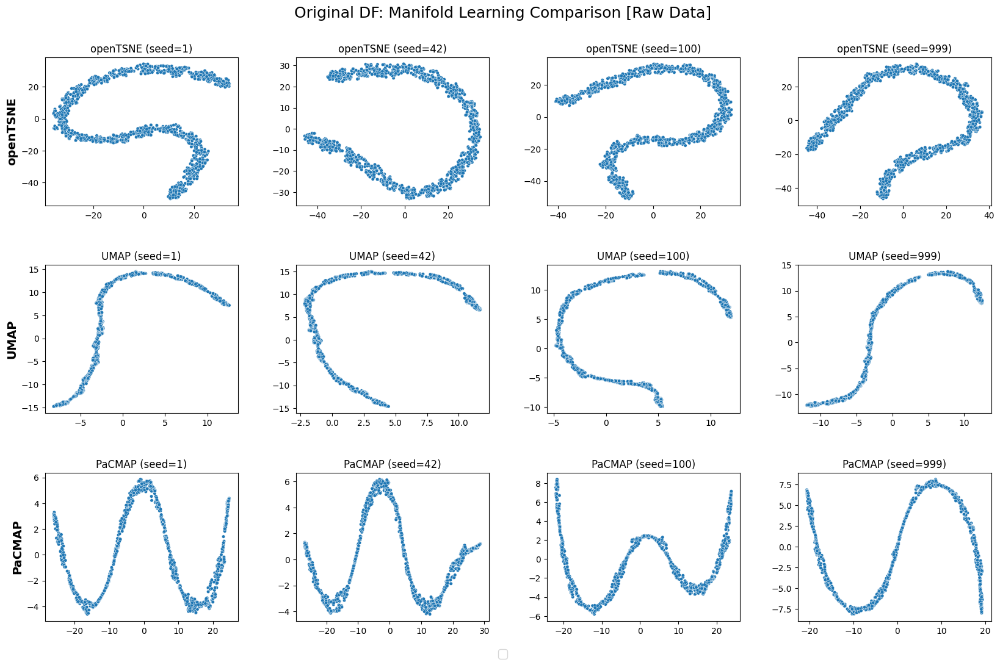

Running openTSNE for Original DF (With PCA Preprocessing)...
Running UMAP for Original DF (With PCA Preprocessing)...


/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Running PaCMAP for Original DF (With PCA Preprocessing)...


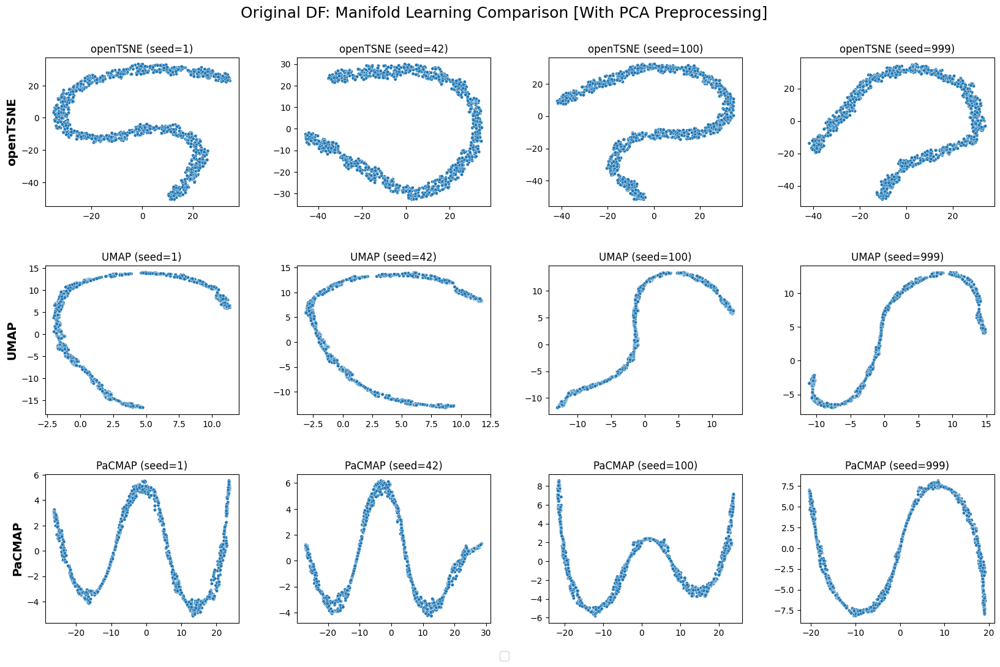

PROCESSING DATASET: df_out_1
Running openTSNE for df_out_1 (Raw Data)...
Running UMAP for df_out_1 (Raw Data)...


/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Running PaCMAP for df_out_1 (Raw Data)...


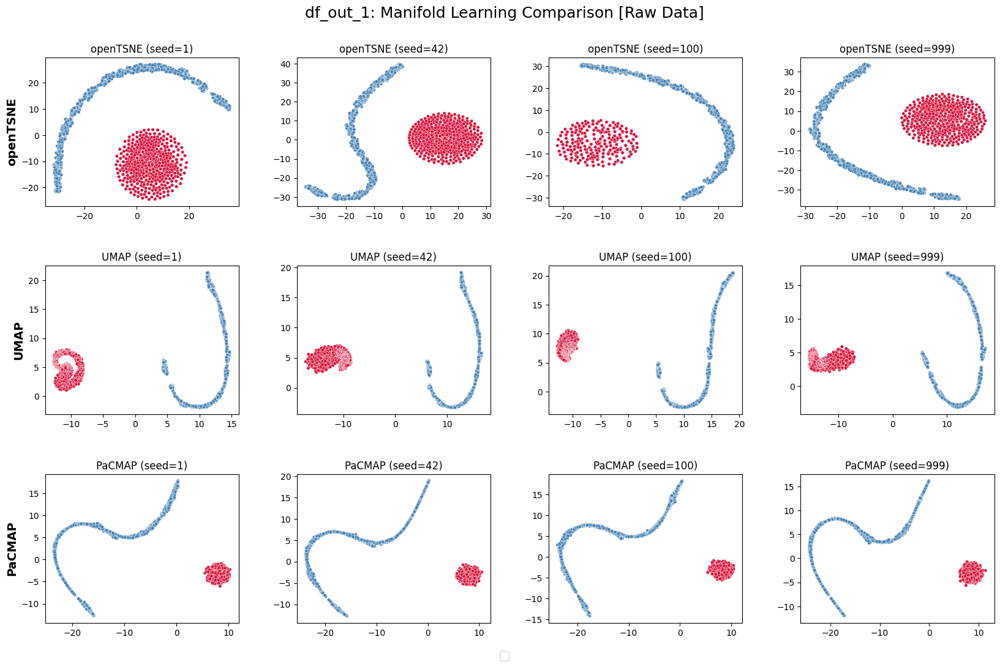

Running openTSNE for df_out_1 (With PCA Preprocessing)...
Running UMAP for df_out_1 (With PCA Preprocessing)...


/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Running PaCMAP for df_out_1 (With PCA Preprocessing)...


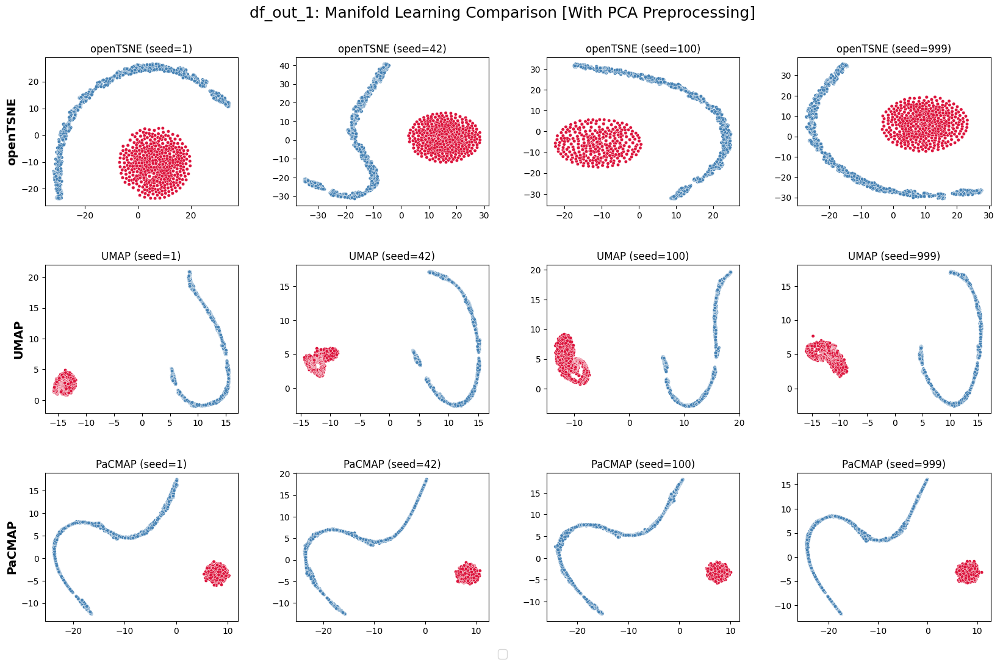

PROCESSING DATASET: df_out_2
Running openTSNE for df_out_2 (Raw Data)...
Running UMAP for df_out_2 (Raw Data)...


/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Running PaCMAP for df_out_2 (Raw Data)...


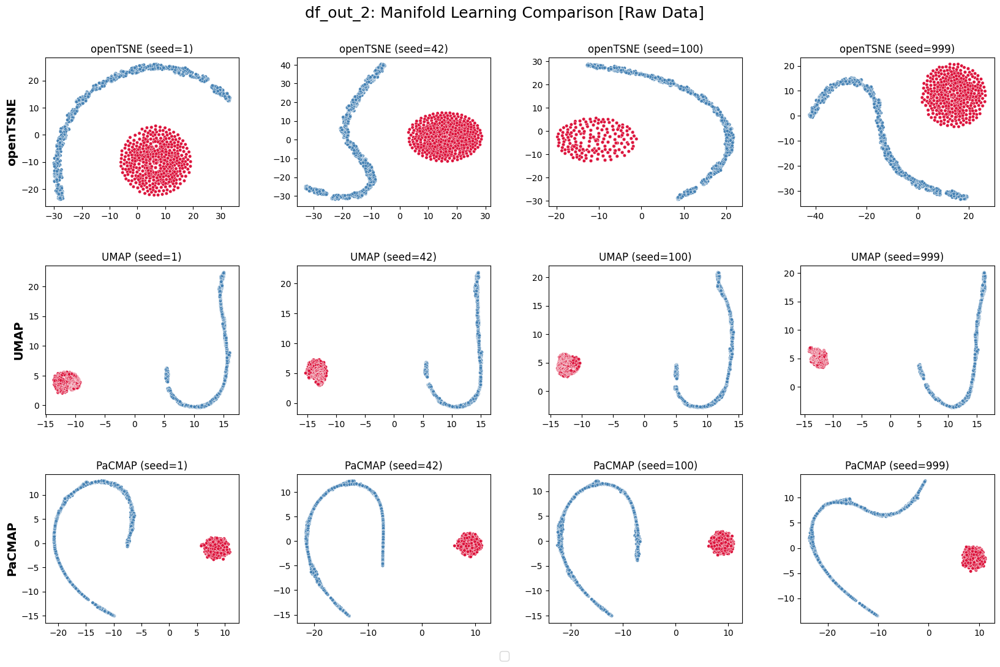

Running openTSNE for df_out_2 (With PCA Preprocessing)...
Running UMAP for df_out_2 (With PCA Preprocessing)...


/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Running PaCMAP for df_out_2 (With PCA Preprocessing)...


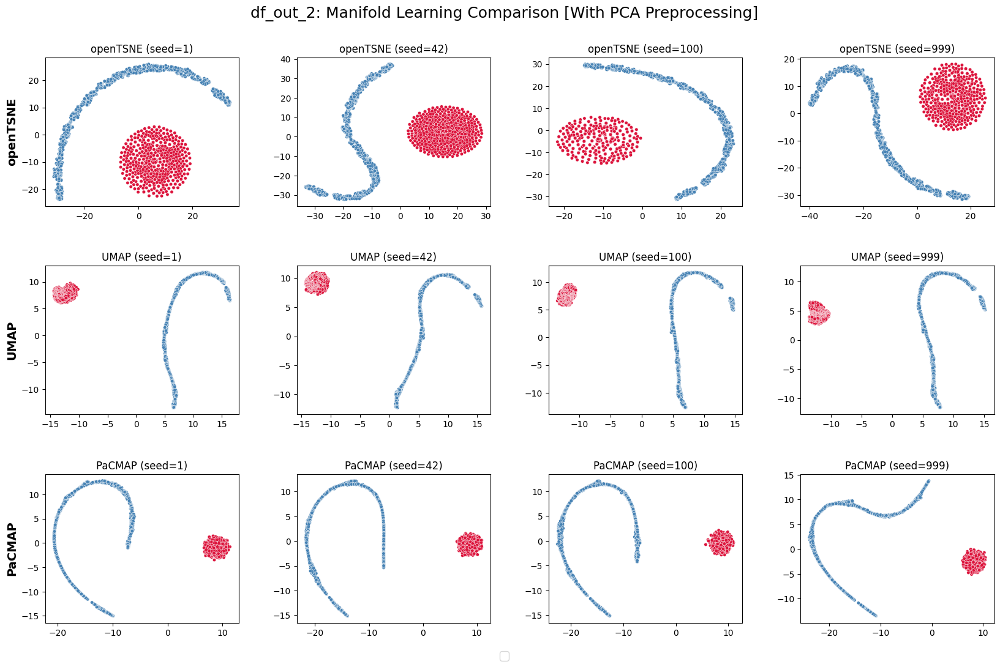

PROCESSING DATASET: df_out_5
Running openTSNE for df_out_5 (Raw Data)...
Running UMAP for df_out_5 (Raw Data)...


/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Running PaCMAP for df_out_5 (Raw Data)...


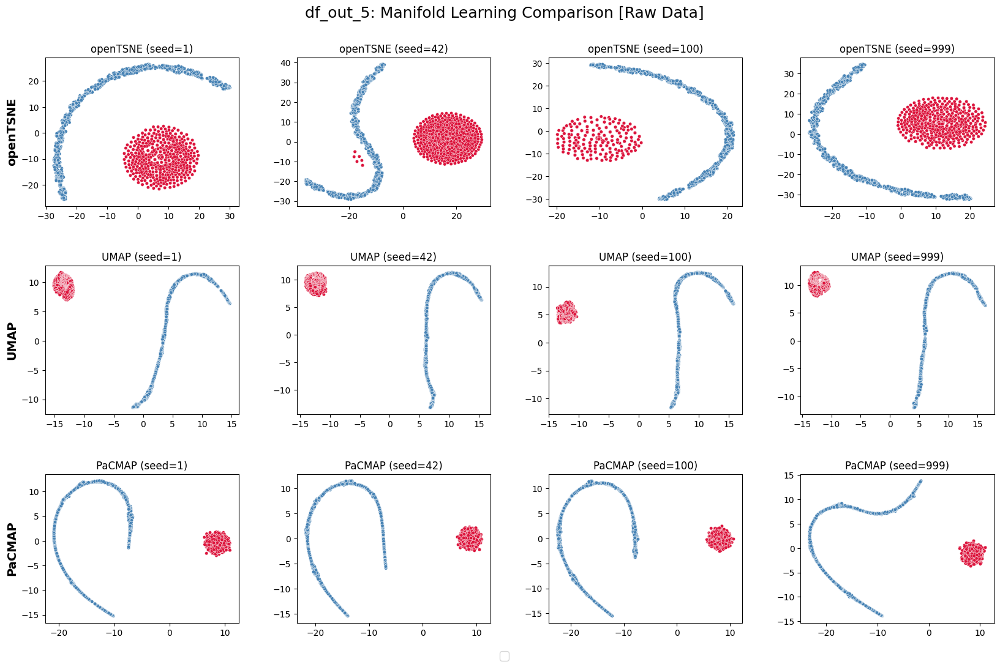

Running openTSNE for df_out_5 (With PCA Preprocessing)...
Running UMAP for df_out_5 (With PCA Preprocessing)...


/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Running PaCMAP for df_out_5 (With PCA Preprocessing)...


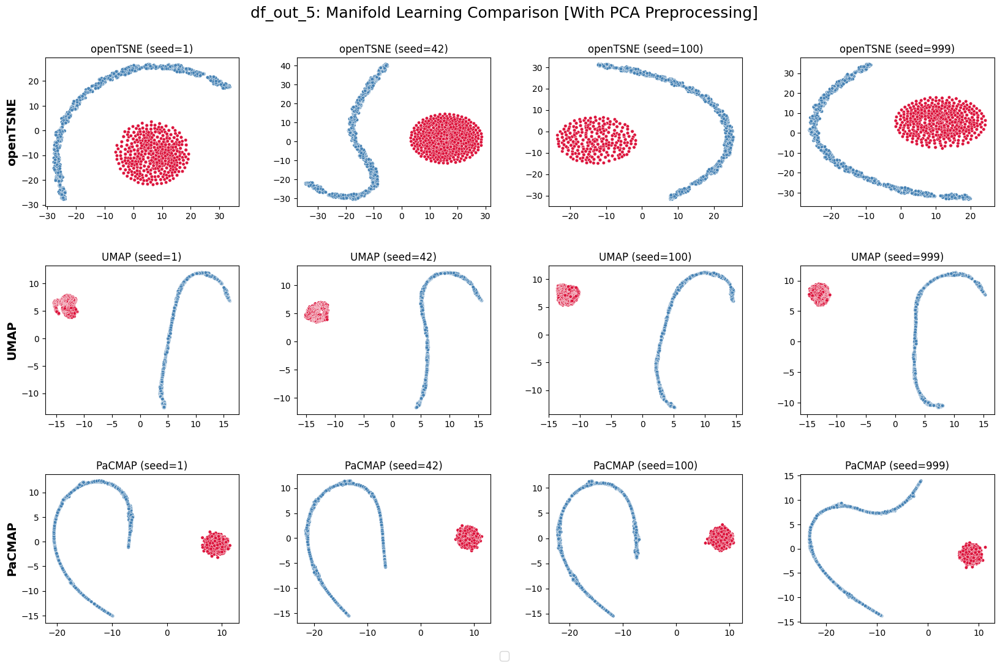

PROCESSING DATASET: df_out_10
Running openTSNE for df_out_10 (Raw Data)...
Running UMAP for df_out_10 (Raw Data)...


/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Running PaCMAP for df_out_10 (Raw Data)...


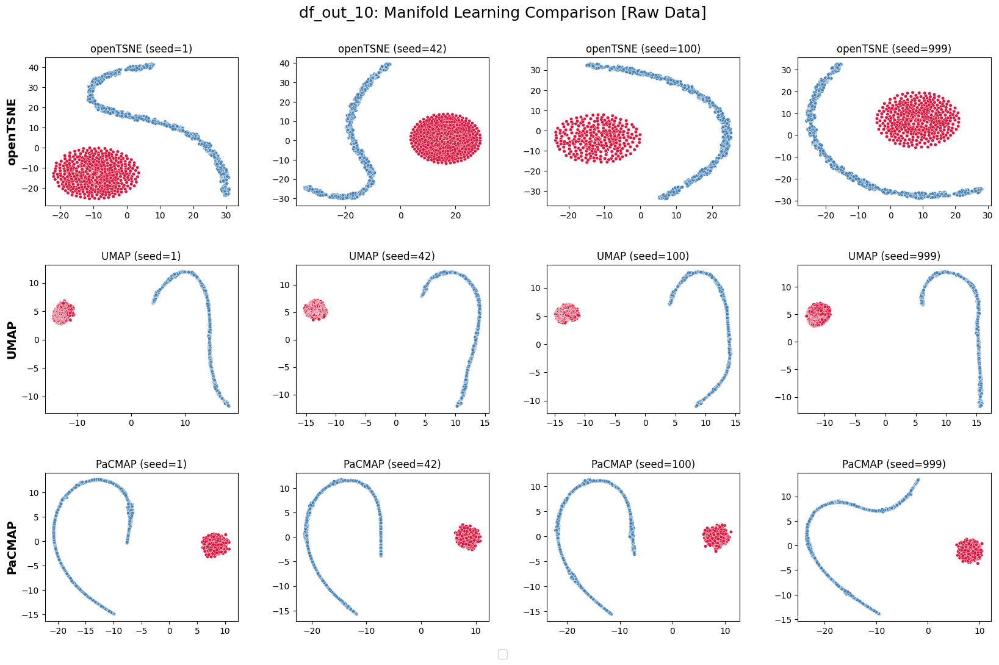

Running openTSNE for df_out_10 (With PCA Preprocessing)...
Running UMAP for df_out_10 (With PCA Preprocessing)...


/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Running PaCMAP for df_out_10 (With PCA Preprocessing)...


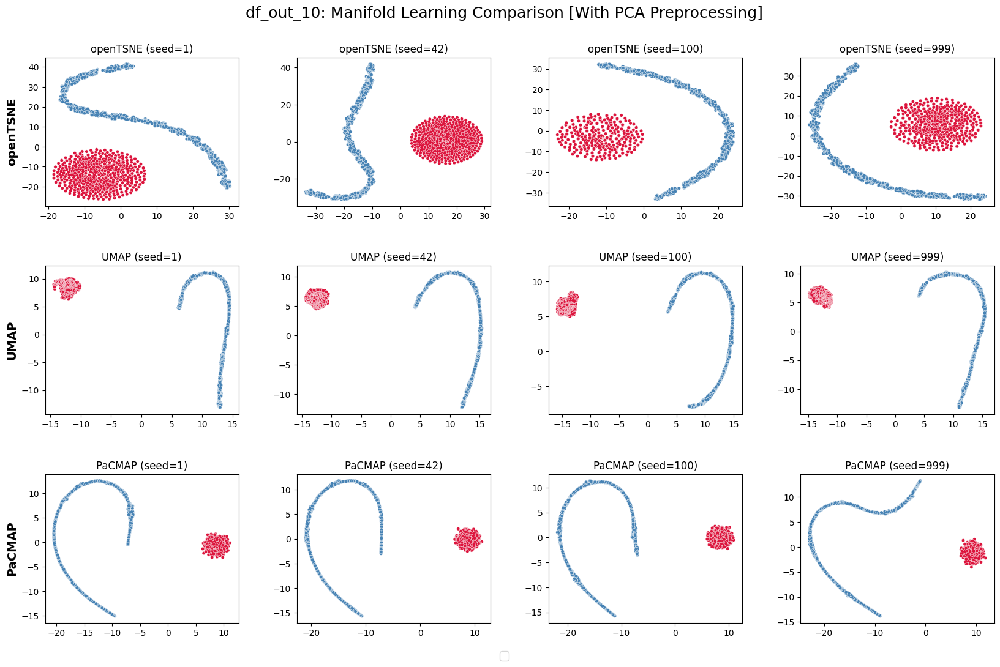

In [151]:
datasets_to_process = {'Original DF': df.assign(Type='Original Data')}
datasets_to_process.update(dfs_out)

for name, current_df in datasets_to_process.items():
    print("="*80)
    print(f"PROCESSING DATASET: {name}")
    print("="*80)
    
    task4(current_df, name, use_pca_preprocessing=False)
    
    task4(current_df, name, use_pca_preprocessing=True)

### task5

**Формулировка:** Сгенерировать и визуализировать на парах признаков $4$-мерный датасет $df_{LDA}$ из двух классов (каждый размером $1000$ точек), в котором отдельные точки данных первого класса расположены вдоль линии с началом $(0, 0, 0, 0)$ и завершением $(+A, +A, +A, +A)$, отдельные точки данных второго класса расположены вдоль линии с началом $(+\frac{A}{100}, 0, 0, 0)$ и завершением $(+A + \frac{A}{100}, +A, +A, +A)$, с дисперсиями для каждого класса вдоль осей $\frac{A}{200000}$.

In [152]:
line_base = np.linspace(0, A, N)
variance = A/200000
std_dev = np.sqrt(variance)
noise = np.random.normal(0, std_dev, size=(N, 4))

In [153]:
base_c1 = np.column_stack([line_base]*4)
data_c1 = base_c1 + noise1

df_c1 = pd.DataFrame(data_c1, columns=['Axis_1', 'Axis_2', 'Axis_3', 'Axis_4'])
df_c1['class'] = 1

In [154]:
base_c2 = base_c1.copy()
base_c2[:, 0] += A/100

data_c2 = base_c2 + noise    
df_c2 = pd.DataFrame(data_c2, columns=['Axis_1', 'Axis_2', 'Axis_3', 'Axis_4'])
df_c2['class'] = 2

In [155]:
df_LDA = pd.concat([df_c1, df_c2], ignore_index=True)
pd.concat([df_lda.head(), df_lda.tail()])

,Axis_1,Axis_2,Axis_3,Axis_4,class
0,0.006146,-0.002146,0.037974,0.000519,1
1,-0.003469,0.003208,0.037070,0.048058,1
2,0.054593,-0.015785,0.066424,0.013928,1
3,0.049012,0.027926,0.003242,0.023183,1
4,0.061869,0.054977,0.021624,0.036472,1
1995,10.021062,9.999580,9.932964,9.993170,2
1996,9.992014,9.924117,9.999241,10.003690,2
1997,9.952239,9.984410,9.962371,9.898552,2
1998,9.978193,9.988005,10.005684,9.994566,2
1999,10.016528,9.985054,10.006697,10.018937,2


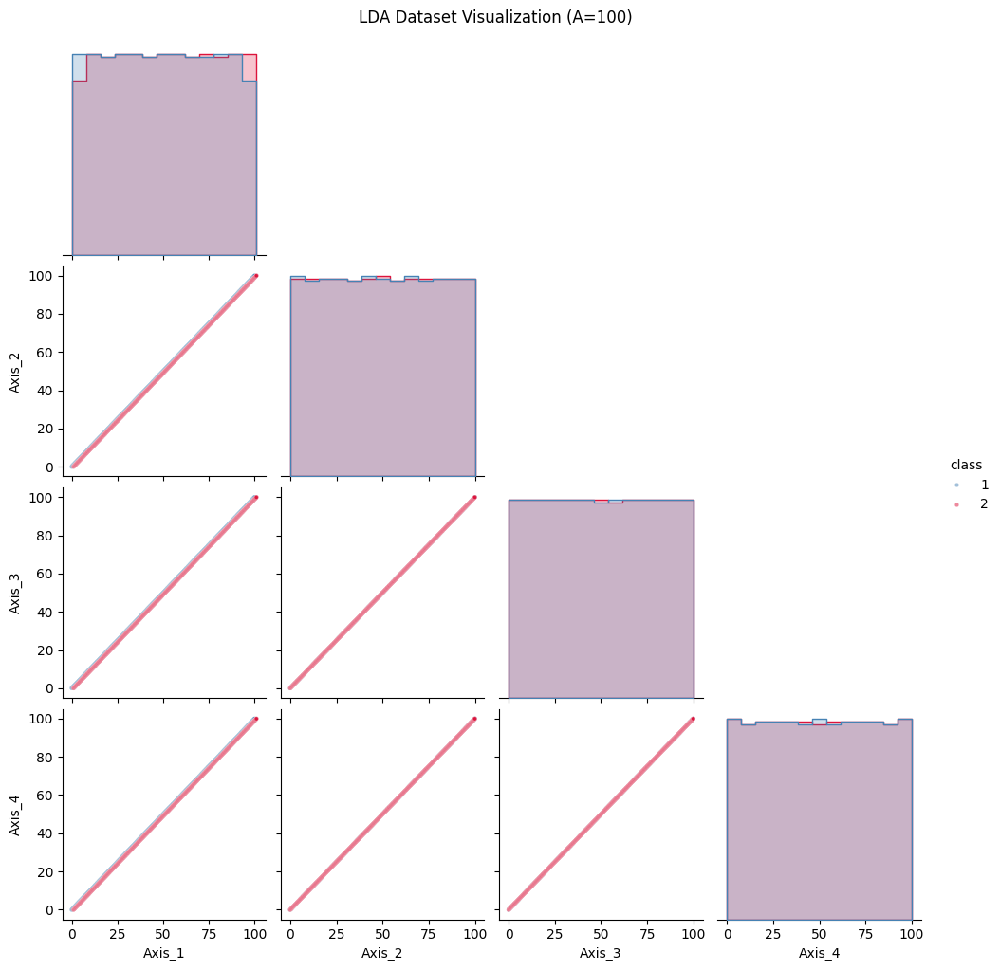

In [157]:
g = sns.pairplot(
    df_LDA,
    hue='class',
    palette={1 : 'steelblue', 2 : 'crimson'},
    diag_kind='hist', 
    corner=True,      
    plot_kws={'s': 10, 'alpha': 0.5},
    diag_kws={'fill': True, 'element': 'step'}
)

g.fig.suptitle(f'LDA Dataset Visualization (A={A})', y=1.02)
plt.show()

### task6

**Формулировка:** Используя метод главных компонент (основанный на корреляциях), для датасета
df_LDA из пункта [5](#task5)  выполнить визуализации аналогично подпунктам пункта [3](#task3).


==================== Processing: LDA Dataset (Linearly Separable) ====================


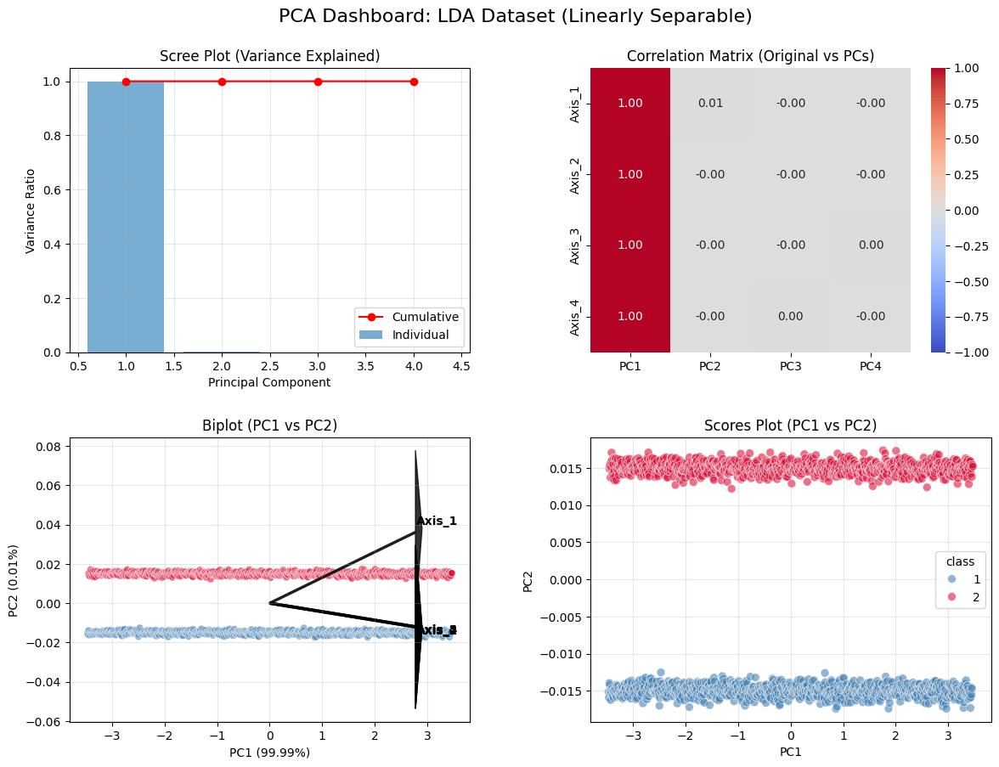

--- Pairplot (All Pairs) for LDA Dataset (Linearly Separable) ---


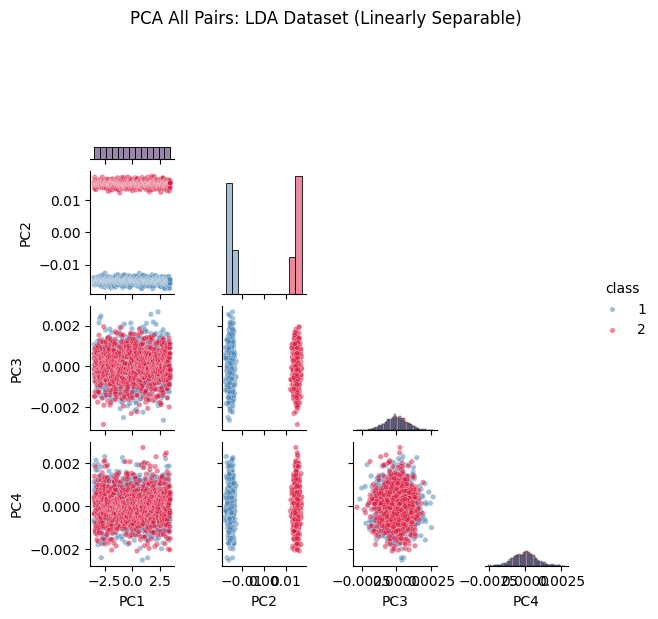

In [160]:
task3(
    df_LDA, 
    title_suffix="LDA Dataset (Linearly Separable)", 
    target_col='class',                   # Указываем имя колонки
    custom_palette={1: 'steelblue', 2: 'crimson'} # Цвета классов
)

### task7

**Формулировка:** Используя метод LDA, для датасета df_LDA из пункта [5](#task5) выполнить визуализации решения LDA на всех парах переменных.

***Алгоритм Аналитического решения задачи классификации LDA был разобран в** [Лабораторной работе №2](https://github.com/ilushka-obnimashka/Statistical_decision_theory/blob/master/2lab.ipynb) (task5-6)***

In [169]:
import time

from numpy.linalg import inv, pinv 
import warnings
from sklearn.datasets import make_blobs
from scipy.linalg import eigh as sp_eigh

In [170]:
def softmax(logits : np.ndarray ) -> np.ndarray:
    numerator = np.exp(logits - np.max(logits, axis=1, keepdims=True))
    denominator = np.sum(numerator, axis=1, keepdims=True)
    return numerator/denominator

In [171]:
class LDA:
    """
    Реализация Линейного Дискриминантного Анализа (LDA) 
    для понижения размерности и классификации.
    """
    def __init__(self, n_components=None):
        self.n_components = n_components
        self.dvecs = None        # Векторы для transform (Шаг 6)
        self.weights = None      # Веса для predict (Шаг 4)
        self.bias = None         # Смещение для predict (Шаг 5)
        self.feature_names_ = None
        self.classes_ = None
        self.class_to_int_ = None
        self.int_to_class_ = None
        self.means_ = None

    def fit(self, df_or_X, y_or_target_col):
        if isinstance(df_or_X, pd.DataFrame):
            X = df_or_X.drop(columns=[y_or_target_col]).values
            y_series = df_or_X[y_or_target_col]
            self.feature_names_ = df_or_X.drop(columns=[y_or_target_col]).columns.tolist()
        else:
            X = df_or_X
            y_series = pd.Series(y_or_target_col)
            self.feature_names_ = [f'feature_{i}' for i in range(X.shape[1])]
            
        n_samples, n_features = X.shape
        
        self.classes_ = np.unique(y_series)
        K = len(self.classes_) # Число классов
        
        if n_samples <= K:
            raise ValueError("Число выборок (n_samples) должно быть больше числа классов (K).")

        self.class_to_int_ = {cls: i for i, cls in enumerate(self.classes_)}
        self.int_to_class_ = {i: cls for i, cls in enumerate(self.classes_)}
        y = y_series.map(self.class_to_int_).values
        
        # Шаг 1: Вычисление априорных вероятностей и средних
        cls_unique, cls_counts = np.unique(y, return_counts=True)
        
        # Формула (1)
        priors = cls_counts / n_samples
        # Формула (2)
        self.means_ = np.array([X[y == cls].mean(axis=0) for cls in cls_unique])
        # Формула (3)
        X_mean = X.mean(axis=0)
        
       
        # Шаг 2: Расчет матриц     
        # Шаг 2.2: Межклассовая матрица рассеяния S_B (только для transform)
        Sb = np.zeros((n_features, n_features))
        for i, mean_k in enumerate(self.means_):
            n_k = cls_counts[i]
            mean_diff = (mean_k - X_mean).reshape(n_features, 1)
            # Формула (5)
            Sb += n_k * (mean_diff @ mean_diff.T)
        
        # Шаг 2.1: Внутриклассовая матрица рассеяния S_W
        within_cls_deviation = X - self.means_[y]
        # Формула (4)
        Sw = within_cls_deviation.T @ within_cls_deviation

        # Шаг 3: Нахождение дискриминантных векторов v (для transform)
        try:
            # Решаем S_B * v = lambda * S_W * v
            # Формула (7)
            evals, evecs = sp_eigh(Sb, Sw)
            self.dvecs = evecs[:, np.argsort(evals)[::-1]]
        except (np.linalg.LinAlgError, ValueError):
            warnings.warn("Не удалось найти дискриминантные векторы (dvecs). Transform будет недоступен.")
            self.dvecs = None


        # Шаги для Классификации (predict) 
        # Шаг 2.3: Объединенная матрица ковариации Sigma (только для predict)
        # Формула (6)
        pooled_cov = Sw / (n_samples - K)  

        # Находим обратную Sigma
        try:
            cov_inv = inv(pooled_cov)
        except np.linalg.LinAlgError:
            warnings.warn(f"Матрица ковариации вырождена. Используется псевдообратная матрица.")
            cov_inv = pinv(pooled_cov)
            
        # Шаг 4: Расчет матрицы весов W
        # Формула (9)
        self.weights = self.means_ @ cov_inv
        
        # Шаг 5: Расчет вектора смещения b
        # Формула (10)
        self.bias = np.log(priors) - 0.5 * np.diag(self.means_ @ self.weights.T)

        if self.n_components is None:
            self.n_components = min(K - 1, n_features)

        return self

    def transform(self, df):
        """ Шаг 6: Проекция данных на дискриминантное подпространство. """
        if self.dvecs is None:
            raise RuntimeError("Метод transform недоступен, так как dvecs не были вычислены.")
        
        try:
            X = df[self.feature_names_].values
        except KeyError:
            raise ValueError("Столбцы в DataFrame не соответствуют тем, что были при обучении.")
        
        # Формула (11)
        transformed_data = X @ self.dvecs[:, :self.n_components]
        
        ld_columns = [f'LD{i+1}' for i in range(self.n_components)]
        return pd.DataFrame(transformed_data, index=df.index, columns=ld_columns)

    def predict(self, X_or_df):
        """ Шаг 7: Прогноз классов для новых данных. """
        if self.weights is None or self.bias is None:
            raise RuntimeError("Модель не обучена для предсказания.")
            
        X_test = X_or_df[self.feature_names_].values if isinstance(X_or_df, pd.DataFrame) else X_or_df
        # Формула (12)
        scores = X_test @ self.weights.T + self.bias
        # Формула (13)
        int_predictions = np.argmax(scores, axis=1)
        return np.array([self.int_to_class_[i] for i in int_predictions])
    
    def predict_proba(self, X_or_df):
        if self.weights is None:
            raise RuntimeError("Модель не обучена.")
        
        X = X_or_df[self.feature_names_].values if isinstance(X_or_df, pd.DataFrame) else X_or_df
        # Формула (12)
        logits = X @ self.weights.T + self.bias
        
        return softmax(logits)

In [172]:
import itertools
from sklearn.utils import resample 

In [173]:
def plot_lda_pair_boundary(ax, model, X, y, feature_names, class_map_inv):

    # 1. Рисуем контуры решений
    x_min, x_max = X[:, 0].min(), X[:, 0].max()
    y_min, y_max = X[:, 1].min(), X[:, 1].max()
    
    # Добавляем отступы (margin), чтобы точки не прилипали к краям
    margin_x = (x_max - x_min) * 0.1 if (x_max - x_min) > 0 else 1.0
    margin_y = (y_max - y_min) * 0.1 if (y_max - y_min) > 0 else 1.0
    
    xx, yy = np.meshgrid(
        np.arange(x_min - margin_x, x_max + margin_x, (x_max - x_min + 2*margin_x)/200),
        np.arange(y_min - margin_y, y_max + margin_y, (y_max - y_min + 2*margin_y)/200)
    )
    
    # Предсказание для всей сетки
    try:
        # Собираем DataFrame для predict, так как ваш класс может требовать имена колонок
        mesh_df = pd.DataFrame(np.c_[xx.ravel(), yy.ravel()], columns=feature_names)
        Z = model.predict(mesh_df)
    except:
        # Если predict принимает numpy array
        Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
        
    # Превращаем метки классов обратно в 0/1 для контура
    # (Предполагаем, что model.classes_ отсортированы, 0 - первый класс, 1 - второй)
    Z_numeric = np.array([1 if cls == model.classes_[1] else 0 for cls in Z]).reshape(xx.shape)
    
    ax.contourf(xx, yy, Z_numeric, cmap=plt.cm.coolwarm, alpha=0.3)
    ax.contour(xx, yy, Z_numeric, colors='k', linewidths=0.5, alpha=0.5)

    # 2. Рисуем точки
    colors = ['blue', 'red']
    for i, cls in enumerate(model.classes_):
        idx = np.where(y == cls)
        ax.scatter(X[idx, 0], X[idx, 1], c=colors[i], label=f'Class {cls}', 
                   s=10, alpha=0.6, edgecolors='none')
        
        # Центроид
        mean_point = X[idx].mean(axis=0)
        ax.scatter(mean_point[0], mean_point[1], c=colors[i], s=100, marker='X', edgecolors='white', linewidth=1.5)

    # 3. Оформление
    ax.set_xlabel(feature_names[0])
    ax.set_ylabel(feature_names[1])
    ax.legend(loc='upper left', fontsize='small')

In [176]:
def task7(df_input, target_col):

    features = [c for c in df_input.columns if c != target_col]
    
    #(Axis_1, Axis_2), (Axis_1, Axis_3) и т.д.
    pairs = list(itertools.combinations(features, 2))
    n_pairs = len(pairs)
    
    print(f"Анализ LDA для {n_pairs} пар признаков...")

    # Настройка сетки графиков (2 строки по 3 графика)
    cols = 3
    rows = (n_pairs + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))
    axes = axes.flatten()
    
    for i, (f1, f2) in enumerate(pairs):
        ax = axes[i]
        
        X_pair = df_input[[f1, f2]].values 
        y = df_input[target_col].values
        
        lda = LDA()
        lda.fit(X_pair, y)
        
        plot_lda_pair_boundary(
            ax, 
            lda, 
            X_pair,
            y, 
            [f1, f2], 
            lda.int_to_class_
        )
        
        preds = lda.predict(X_pair)
        acc = np.mean(preds == y)
        ax.set_title(f"{f1} vs {f2} (Acc: {acc:.2f})")

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
        
    plt.tight_layout()
    plt.suptitle("LDA Decision Boundaries on All Feature Pairs", y=1.02, fontsize=16)
    plt.show()

Анализ LDA для 6 пар признаков...


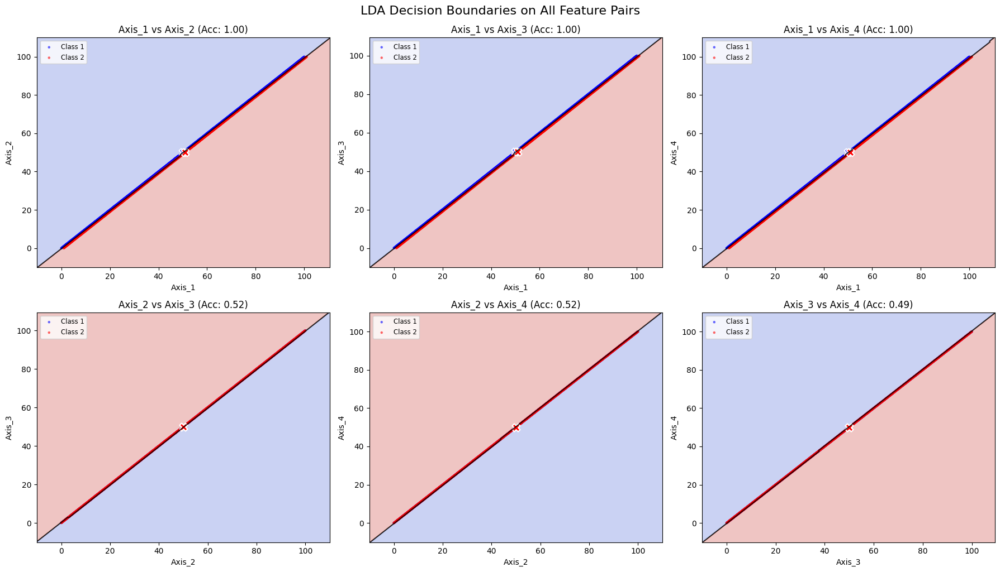

In [177]:
task7(df_LDA, target_col='class')

### task8

**Формулировка:** Взять с Kaggle датасет, в котором есть >=10 переменных, >=10000 объектов и несколько классов.

In [1]:
!pip install kagglehub[pandas-datasets]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.3/68.3 kB 1.4 MB/s eta 0:00:00 MB/s eta 0:00:01


In [60]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("oddrationale/mnist-in-csv")

print("Path to dataset files:", path)

100%|████████████████████████████████████| 15.2M/15.2M [00:03<00:00, 4.53MB/s]

Extracting files...


Path to dataset files: /home/ilya-trushkin/.cache/kagglehub/datasets/oddrationale/mnist-in-csv/versions/2


In [61]:
import os

data_path = []
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        data_path.append(os.path.join(dirname, filename))

data_path 

['/home/ilya-trushkin/.cache/kagglehub/datasets/oddrationale/mnist-in-csv/versions/2/mnist_test.csv',
 '/home/ilya-trushkin/.cache/kagglehub/datasets/oddrationale/mnist-in-csv/versions/2/mnist_train.csv']

In [63]:
df = (pd.read_csv(data_path[1]))
df.head()

,label,1x1,1x2,1x3,1x4,1x5,1x6,1x7,1x8,1x9,...,28x19,28x20,28x21,28x22,28x23,28x24,28x25,28x26,28x27,28x28
0,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### task9 

**Формулировка:** Используя метод главных компонент (основанный на корреляциях), для датасета из пункта [8](#task8) определить различными способами (метод Кайзера, метод ломанной трости), сколько компонент необходимо оставлять для регрессионной модели.

In [74]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

def task9(df: pd.DataFrame):
    
    # 1. Подготовка данных
    # Отделяем целевую переменную (label/class), если она есть, так как PCA — метод без учителя
    # И удаляем все нечисловые колонки
    if 'label' in df.columns:
        X = df.drop(columns=['label'])
    else:
        raise ValueError("The dataset does not contain a 'label' column")
        
    # 2. Стандартизация (для PCA на основе корреляционной матрицы)
    # Это переводит все признаки к среднему 0 и дисперсии 1
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # 3. Применение PCA
    # Берем все компоненты (n_components = количеству признаков)
    n_features = X_scaled.shape[1]
    pca = PCA(n_components=n_features)
    pca.fit(X_scaled)

    # Собственные числа (Eigenvalues)
    # В sklearn explained_variance_ для стандартизированных данных = собственные числа
    eigenvalues = pca.explained_variance_
    
    # --- МЕТОД 1: Критерий Кайзера (Kaiser Rule) ---
    # Оставляем компоненты, у которых собственное число > 1
    kaiser_n = np.sum(eigenvalues > 1)

    # --- МЕТОД 2: Метод ломаной трости (Broken Stick) ---
    # Формула: b_k = sum(1/i) для i от k до p
    broken_stick = []
    for k in range(1, n_features + 1):
        bs_value = np.sum([1/i for i in range(k, n_features + 1)])
        broken_stick.append(bs_value)
    
    broken_stick = np.array(broken_stick)
    
    # Оставляем компоненты, где реальное собственное число > значения ломаной трости
    broken_stick_n = np.sum(eigenvalues > broken_stick)

    # --- Визуализация (Scree Plot) ---
    import matplotlib.ticker as ticker # Нужен для красивых осей

    plt.figure(figsize=(10, 6)) # Чуть шире стандартного
    
    components = np.arange(1, n_features + 1)
    
    # Рисуем графики
    plt.plot(components, eigenvalues, 'o-', linewidth=2, markersize=4, color='blue', label='Собственные числа (PCA)')
    plt.plot(components, broken_stick, '--', linewidth=2, color='green', label='Ломаная трость (Broken Stick)')
    plt.axhline(y=1, color='r', linestyle=':', label='Порог Кайзера (y=1)')
    
    # НАСТРОЙКА ОСЕЙ (ГЛАВНОЕ ИЗМЕНЕНИЕ)
    ax = plt.gca() # Получаем доступ к осям
    
    # Вариант А: Если компонент очень много (как в MNIST > 100), ставим шаг 50 или 100
    if n_features > 100:
        ax.xaxis.set_major_locator(ticker.MultipleLocator(50)) # Подпись каждые 50
        plt.xlim(0, n_features + 1) # Показываем всё (или можно ограничить plt.xlim(0, 150))
    else:
        # Вариант Б: Если компонент мало (как со звездами), подписываем все
        plt.xticks(components)

    plt.title('Scree Plot')
    plt.xlabel('Component number')
    plt.ylabel('Eigenvalue')
    plt.legend()
    plt.grid(True, alpha=0.5) # alpha делает сетку полупрозрачной
    
    # Дополнительно: Можно сделать "зум" на начало графика, так как там самое важное
    # Раскомментируйте строчку ниже, если хотите видеть только начало
    # plt.xlim(0, 100) 
    
    plt.show()

    # Вывод результатов
    print(f"Собственные числа: {np.round(eigenvalues, 4)}")
    print("-" * 30)
    print(f"Рекомендация по методу Кайзера: {kaiser_n} компонент(ы)")
    print(f"Рекомендация по методу Ломаной трости: {broken_stick_n} компонент(ы)")
    
    # Возвращаем PCA объект и трансформированные данные (на случай, если пригодятся)
    return pca, pca.transform(X_scaled)

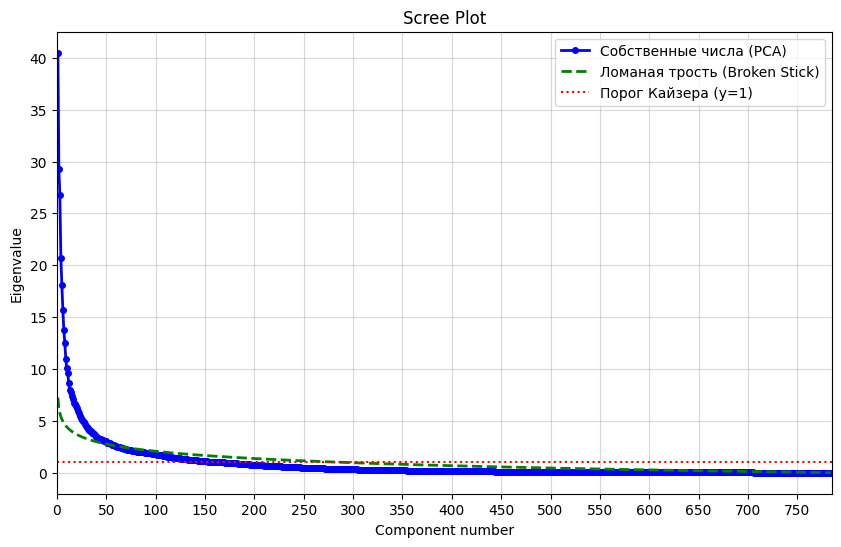

Собственные числа: [4.04876e+01 2.92417e+01 2.68118e+01 2.06866e+01 1.80767e+01 1.57332e+01
 1.37906e+01 1.25176e+01 1.10068e+01 1.00505e+01 9.62050e+00 8.63100e+00
 7.99160e+00 7.81490e+00 7.37550e+00 7.13060e+00 6.71400e+00 6.60400e+00
 6.40600e+00 6.23740e+00 5.93230e+00 5.76060e+00 5.48400e+00 5.31860e+00
 5.12870e+00 4.96060e+00 4.90530e+00 4.70840e+00 4.52920e+00 4.39470e+00
 4.27520e+00 4.21400e+00 4.09840e+00 4.03180e+00 3.97710e+00 3.86050e+00
 3.80860e+00 3.72560e+00 3.64390e+00 3.44170e+00 3.41620e+00 3.36380e+00
 3.25770e+00 3.23620e+00 3.20480e+00 3.17910e+00 3.14210e+00 3.08590e+00
 3.06080e+00 3.03760e+00 2.90170e+00 2.86410e+00 2.84980e+00 2.82370e+00
 2.76630e+00 2.71780e+00 2.69170e+00 2.65850e+00 2.61670e+00 2.57620e+00
 2.52660e+00 2.49370e+00 2.46950e+00 2.43690e+00 2.40880e+00 2.40120e+00
 2.37950e+00 2.31610e+00 2.26770e+00 2.24600e+00 2.22800e+00 2.20300e+00
 2.18630e+00 2.17050e+00 2.14730e+00 2.13500e+00 2.11560e+00 2.08250e+00
 2.05680e+00 2.04830e+00 2.03200

In [75]:
pca_model, X_pca = task9(df)

### task10

**Формулировка:** Используя метод главных компонент (основанный на корреляциях), для датасета из пункта [8](#task8) выполнить визуализации аналогично подпунктам пункта [3](#task3), с учетом числа отобранных компонент.


==================== Task 10: MNIST (n=2) ====================


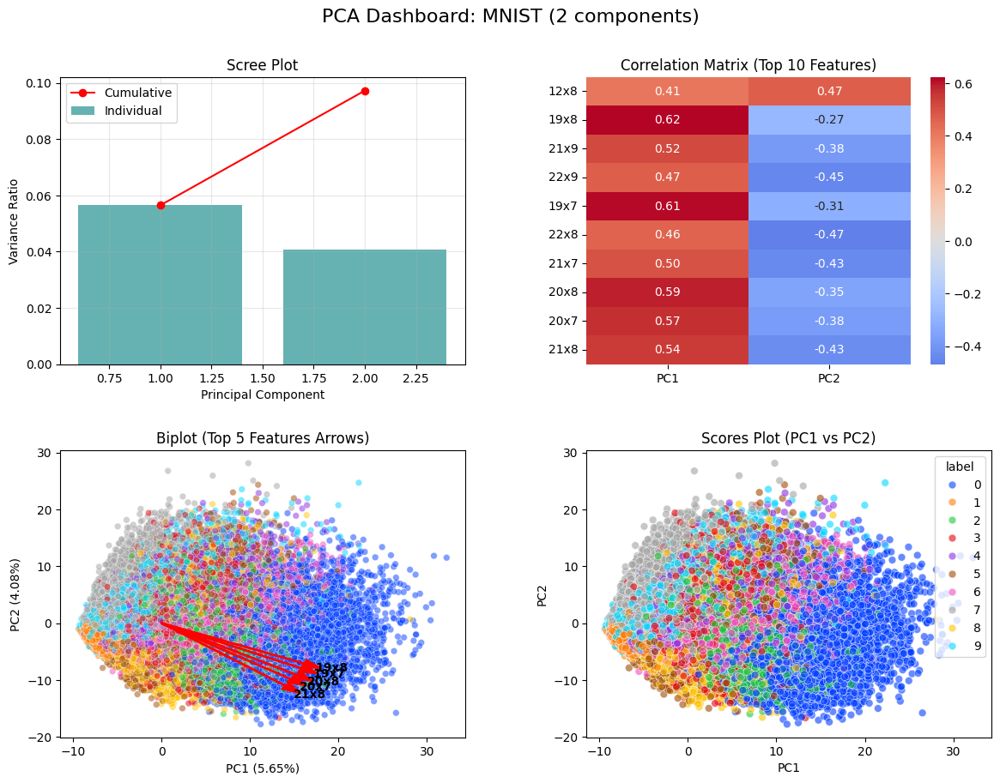

--- Pairplot (2 components) ---


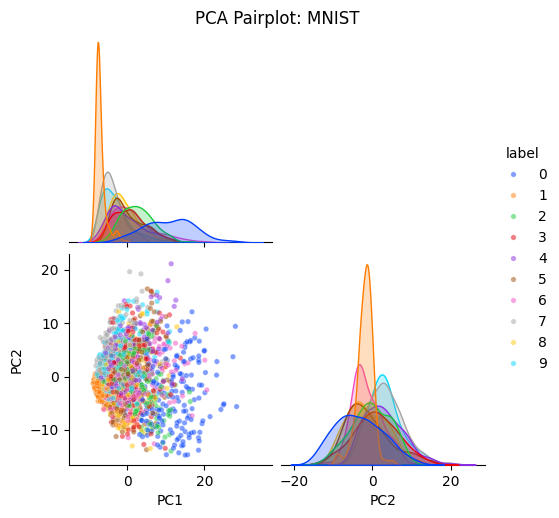

In [82]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

def task10(df_input, n_components, title_suffix="", target_col='label'):
    print(f"\n{'='*20} Task 10: {title_suffix} (n={n_components}) {'='*20}")

    # 1. Подготовка данных
    if target_col in df_input.columns:
        X = df_input.drop(columns=[target_col])
        hue_vals = df_input[target_col]
    else:
        # Пробуем найти колонку с метками
        possible_targets = ['Type', 'class', 'label']
        found = [t for t in possible_targets if t in df_input.columns]
        if found:
            target_col = found[0]
            X = df_input.drop(columns=[target_col])
            hue_vals = df_input[target_col]
        else:
            X = df_input.select_dtypes(include=[np.number])
            hue_vals = None

    # 2. PCA
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    pca = PCA(n_components=n_components)
    X_pca = pca.fit_transform(X_scaled)
    
    component_names = [f"PC{i+1}" for i in range(n_components)]
    pca_df = pd.DataFrame(X_pca, columns=component_names)
    
    if hue_vals is not None:
        pca_df[target_col] = hue_vals.values

    final_palette = 'bright' if (hue_vals is not None and hue_vals.nunique() <= 10) else 'viridis'

    # --- ВИЗУАЛИЗАЦИЯ ---
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    plt.subplots_adjust(hspace=0.3, wspace=0.3)
    fig.suptitle(f'PCA Dashboard: {title_suffix} ({n_components} components)', fontsize=16, y=0.96)

    # [0, 0] Scree Plot
    ax = axes[0, 0]
    x_nums = range(1, len(pca.explained_variance_ratio_) + 1)
    ax.bar(x_nums, pca.explained_variance_ratio_, alpha=0.6, label='Individual', color='teal')
    ax.plot(x_nums, np.cumsum(pca.explained_variance_ratio_), marker='o', color='r', label='Cumulative')
    ax.set_title('Scree Plot')
    ax.set_xlabel('Principal Component')
    ax.set_ylabel('Variance Ratio')
    ax.legend()
    ax.grid(True, alpha=0.3)

    # [0, 1] Heatmap (Топ-10 признаков)
    # ВМЕСТО того чтобы отключать heatmap, покажем только ТОП самых важных признаков
    ax = axes[0, 1]
    
    # Считаем нагрузки
    loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
    
    # Находим индексы самых "сильных" признаков по сумме модулей нагрузок
    # (то есть те пиксели, которые сильнее всего влияют на PC1...PCn)
    importance = np.sum(np.abs(loadings), axis=1)
    top_indices = np.argsort(importance)[-10:] # Берем топ-10
    top_features = X.columns[top_indices]
    
    loadings_df = pd.DataFrame(loadings[top_indices], columns=component_names, index=top_features)
    
    sns.heatmap(loadings_df, annot=True, cmap='coolwarm', center=0, fmt=".2f", ax=ax)
    ax.set_title(f'Correlation Matrix (Top 10 Features)')


    # [1, 0] Biplot (PC1 vs PC2) с ТОП стрелками
    ax = axes[1, 0]
    if n_components >= 2:
        sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue=target_col, palette=final_palette, alpha=0.5, ax=ax, legend=False, s=30)
        
        # --- РИСУЕМ ТОЛЬКО ВАЖНЫЕ СТРЕЛКИ ---
        # Находим топ-5 признаков, которые важны именно для PC1 и PC2
        loadings_pc1_pc2 = loadings[:, :2] # Берем нагрузки только первых 2 компонент
        magnitude = np.sqrt(loadings_pc1_pc2[:, 0]**2 + loadings_pc1_pc2[:, 1]**2) # Длина вектора
        
        # Берем индексы 5 самых длинных стрелок
        top_arrow_indices = np.argsort(magnitude)[-5:] 
        
        max_val_pca = np.max(np.abs(X_pca[:, :2]))
        scale_factor = max_val_pca * 0.8
        
        for i in top_arrow_indices:
            feature_name = X.columns[i]
            pc1_load = loadings[i, 0]
            pc2_load = loadings[i, 1]
            
            # Рисуем стрелку
            ax.arrow(0, 0, pc1_load * scale_factor, pc2_load * scale_factor, color='red', width=0.2, head_width=1.5)
            # Подписываем
            ax.text(pc1_load * scale_factor * 1.2, pc2_load * scale_factor * 1.2, 
                    feature_name, color='black', fontsize=10, fontweight='bold', ha='center')
            
        ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%})")
        ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%})")
        ax.set_title(f'Biplot (Top 5 Features Arrows)')
    else:
        ax.text(0.5, 0.5, "Need >= 2 components", ha='center')

    # [1, 1] Scores Plot
    ax = axes[1, 1]
    if n_components >= 2:
        sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue=target_col, palette=final_palette, alpha=0.6, s=40, ax=ax)
        ax.set_title('Scores Plot (PC1 vs PC2)')
        if hue_vals is not None and hue_vals.nunique() > 10:
             ax.legend().remove()
    else:
        sns.histplot(data=pca_df, x='PC1', hue=target_col, element="step", ax=ax)

    plt.show()

    if n_components > 1:
        print(f"--- Pairplot ({n_components} components) ---")
        plot_df = pca_df.sample(min(2000, len(pca_df)), random_state=42) if len(pca_df) > 2000 else pca_df
        g = sns.pairplot(plot_df, vars=component_names, hue=target_col if hue_vals is not None else None, palette=final_palette, corner=True, plot_kws={'alpha': 0.5, 's': 15})
        g.fig.suptitle(f'PCA Pairplot: {title_suffix}', y=1.02)
        plt.show()

# Запускаем!
task10(df, n_components=2, target_col='label', title_suffix="MNIST")

### task11

**Формулировка :** Используя методы UMAP, PacMAP и tSNE, для датасета из пункта [8](#task8) отдельно визуализировать проекции c нескольких (не менее 2) рендом-стартов, а также после предвращения датасетов методом PCA.


==================== Task 11: Vertical Layout (6x2) ====================
Dataset size: 60000 samples
Standardizing data...
Pre-calculating PCA version (n=50)...
PCA done in 0.37s.
Row 1/6: t-SNE Seed 1 done.
Row 2/6: t-SNE Seed 42 done.


/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Row 3/6: UMAP Seed 1 done.


/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/ilya-trushkin/Desktop/Statistical_decision_theory/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Row 4/6: UMAP Seed 42 done.


Row 5/6: PaCMAP Seed 1 done.


Row 6/6: PaCMAP Seed 42 done.
All calculations done. Displaying plot...


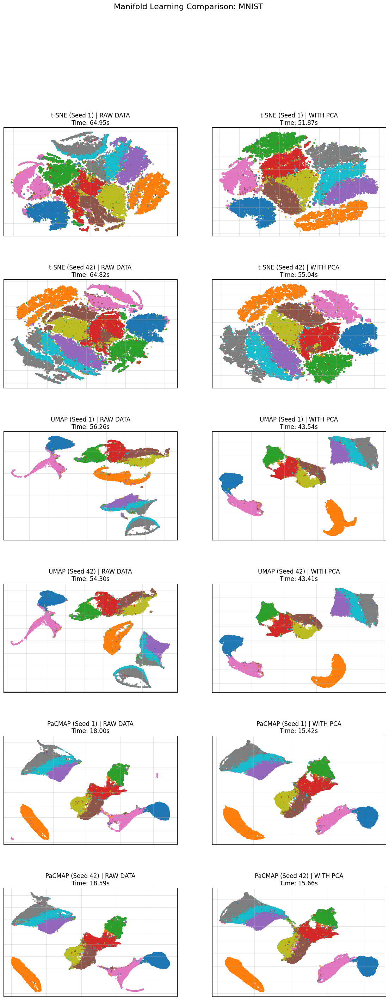

In [92]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Импорты алгоритмов
try:
    from openTSNE import TSNE as OpenTSNE
except ImportError:
    from sklearn.manifold import TSNE as OpenTSNE
import umap
import pacmap

def task11(df_input, target_col='label', title_suffix=""):
    """
    Строит таблицу 6 строк x 2 столбца.
    Слева: RAW DATA, Справа: WITH PCA.
    Каждая строка - это конкретный Метод + Сид.
    """
    print(f"\n{'='*20} Task 11: Vertical Layout (6x2) {'='*20}")

    # 1. Подготовка данных
    df_work = df_input.copy()
    print(f"Dataset size: {len(df_work)} samples")

    if target_col in df_work.columns:
        X = df_work.drop(columns=[target_col]).values
        labels = df_work[target_col].values
        # Палитра 'tab10' дает четкие, но спокойные цвета
        palette = 'tab10' 
    else:
        X = df_work.select_dtypes(include=[np.number]).values
        labels = None
        palette = None

    # 2. Препроцессинг
    print("Standardizing data...")
    X_std = StandardScaler().fit_transform(X) # RAW
    
    print("Pre-calculating PCA version (n=50)...")
    t0 = time.time()
    # Берем 50 компонент (как договаривались)
    pca = PCA(n_components=50)
    X_pca = pca.fit_transform(X_std)          # PCA
    print(f"PCA done in {time.time()-t0:.2f}s.")

    # 3. Настройка сетки
    seeds = [1, 42]
    methods = ['t-SNE', 'UMAP', 'PaCMAP']
    
    # 3 метода * 2 сида = 6 строк
    n_rows = len(methods) * len(seeds)
    n_cols = 2 # Raw vs PCA
    
    # Делаем фигуру высокой (figsize=(ширина, высота))
    # Ширина 14 (чтобы удобно читать 2 колонки), Высота 30 (на 6 рядов)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 32))
    
    # Отступы, чтобы заголовки не наезжали
    plt.subplots_adjust(hspace=0.4, wspace=0.2)
    fig.suptitle(f'Manifold Learning Comparison: {title_suffix}', fontsize=16, y=0.99)

    row_counter = 0

    # --- ГЛАВНЫЙ ЦИКЛ ---
    for method_name in methods:
        for seed in seeds:
            
            # --- КОЛОНКА 1: RAW DATA ---
            ax_raw = axes[row_counter, 0]
            start_t = time.time()
            emb_raw = run_manifold_method(method_name, X_std, seed)
            dur_raw = time.time() - start_t
            
            sns.scatterplot(
                x=emb_raw[:,0], y=emb_raw[:,1], 
                hue=labels, palette=palette, 
                ax=ax_raw, s=10, legend=False, alpha=0.7, linewidth=0
            )
            
            # Обычный шрифт, сетка включена
            ax_raw.set_title(f"{method_name} (Seed {seed}) | RAW DATA\nTime: {dur_raw:.2f}s", fontsize=12)
            ax_raw.grid(True, alpha=0.3)
            ax_raw.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False) # Убираем цифры осей, но оставляем сетку

            # --- КОЛОНКА 2: WITH PCA ---
            ax_pca = axes[row_counter, 1]
            start_t = time.time()
            emb_pca = run_manifold_method(method_name, X_pca, seed)
            dur_pca = time.time() - start_t
            
            sns.scatterplot(
                x=emb_pca[:,0], y=emb_pca[:,1], 
                hue=labels, palette=palette, 
                ax=ax_pca, s=10, legend=False, alpha=0.7, linewidth=0
            )
            
            ax_pca.set_title(f"{method_name} (Seed {seed}) | WITH PCA\nTime: {dur_pca:.2f}s", fontsize=12)
            ax_pca.grid(True, alpha=0.3)
            ax_pca.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

            print(f"Row {row_counter+1}/{n_rows}: {method_name} Seed {seed} done.")
            row_counter += 1

    print("All calculations done. Displaying plot...")
    plt.show()

def run_manifold_method(name, data, seed):
    """Вспомогательная функция запуска"""
    if name == 't-SNE':
        try:
            return OpenTSNE(n_components=2, perplexity=30, n_jobs=-1, random_state=seed, initialization='random').fit(data)
        except TypeError:
            return OpenTSNE(n_components=2, perplexity=30, n_jobs=-1, random_state=seed, init='random').fit_transform(data)
    elif name == 'UMAP':
        return umap.UMAP(n_components=2, random_state=seed, n_neighbors=15, min_dist=0.1, n_jobs=-1).fit_transform(data)
    elif name == 'PaCMAP':
        return pacmap.PaCMAP(n_components=2, random_state=seed).fit_transform(data)
    return None

task11(df, target_col='label', title_suffix="MNIST")